# 05 Trabalho Human Activity Recognition

# **INTEGRANTES DA EQUIPE: LEONARDO MELO COSTA DA SILVA, MILENA DE CARVALHO CORDEIRO**

https://classroom.google.com/c/NTg5MDU1MzM3MDU4/a/NjI1MzM1NzY3NzA5/details

# Informações
### Contextualização
Utilizaremos o banco de dados do Human Activity Recognition with Smartphones,
que foi construído a partir das gravações dos participantes do estudo realizando
atividades da vida diária enquanto carregavam um smartphone com sensores
inerciais embutidos. Para cada registro no conjunto de dados é fornecido:



- Aceleração triaxial do acelerômetro (aceleração total) e a aceleração
corporal estimada.

- Velocidade angular triaxial do giroscópio.

- Um vetor de 561 atributos com variáveis de domínio de tempo e frequência.

- O rótulo da atividade.



Mais informações sobre os recursos estão disponíveis no site:
https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones



### Objetivo:


Construir um modelo robusto para classificação de
atividades diárias utilizando o banco de dados fornecido. Atividades: caminhar,
subir escadas, descer escadas, sentar, ficar em pé e deitar.



### Objetivos específicos:

. Avaliar qualitativa e quantitativamente o banco de dados, utilizando
ferramentas estatísticas e gráficas para análise exploratória para entendimento
dos dados.

. Treinar, validar e testar diferentes tipos de modelos de IA, a saber:
regressão logística, KNN, MLP, SVM, uma técnica de ensemble de bagging, uma de
boosting e uma de stacking.

. Avaliar qualitativa e quantitativamente qual das técnicas teve o melhor
desempenho, apresentando os resultados de forma gráfica e em tabelas.



Utilize os conceitos estudados, implementando o trabalho em Python utilizando
jupyter notebook. Explore diferentes hiper parâmetros para ajuste fino dos
modelos.


Trabalho deverá ser realizado em grupo. Caprichem!

# Entrada de Dados

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os
import tensorflow as tf

from google.colab import files
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler,OrdinalEncoder,FunctionTransformer, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
#from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
import seaborn as sns
#from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.ensemble import ExtraTreesClassifier
import pickle
import numpy as np
# from sklearn.datasets import fetch_california_housing, load_digits, load_iris
# from sklearn.metrics import confusion_matrix, mean_squared_error
# from sklearn.model_selection import GridSearchCV, KFold, train_test_split
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import load_iris
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import StackingClassifier
# from sklearn.datasets import load_iris
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import StackingClassifier
# Bibliotecas
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers import Dense, Dropout

In [ ]:
def fixa_seed():
  import random
  seed = 1
  os.environ['PYTHONHASHSEED']=str(seed)
  tf.random.set_seed(seed)
  np.random.seed(seed)
  random.seed(seed)
  return seed

In [ ]:
#resultados = resultados.append(row, ignore_index=True)

def add(d, m, a, i=True, p=None):
  if not p:
    p = m.get_params()
  row = {'modelo': m,
         'nome': m.__class__.__name__,
       'acuracia': a,
       'inicial': i,
       'parametros': p}
  print(row)
  return d.append(row, ignore_index=True)

In [ ]:
resultados = pd.DataFrame(columns=['modelo', 'nome', 'acuracia', 'inicial', 'parametros'])

In [ ]:
#Passo 1: Carregamento do csv
# uploaded = files.upload()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# file_name = next(iter(uploaded))
file_name = '/content/drive/MyDrive/Fundamentos_IA/Human_Activity_Recognition_Using_Smartphones_Data.csv'

In [ ]:
df = pd.read_csv(file_name)


# Pré-processamento(EDA) e Transformação dos Dados

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10299 entries, 0 to 10298
Columns: 562 entries, tBodyAcc-mean()-X to Activity
dtypes: float64(561), object(1)
memory usage: 44.2+ MB


In [ ]:
df.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,-0.466732,...,0.126708,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284
std,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,0.538707,...,0.245443,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,-0.935788,...,-0.019481,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880
50%,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,-0.874825,...,0.136245,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882
75%,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,-0.014641,...,0.288960,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<Axes: >

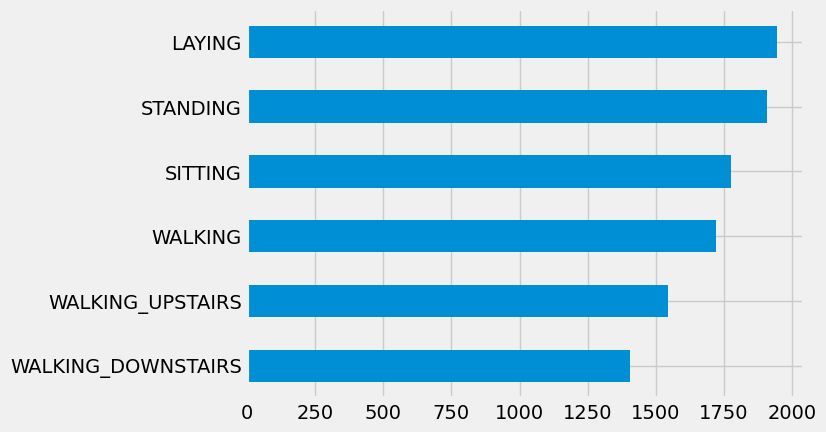

In [ ]:
df['Activity'].value_counts().sort_values().plot(kind='barh')

In [ ]:
dist_act = df['Activity'].value_counts()

In [ ]:
dist_act

LAYING                1944
STANDING              1906
SITTING               1777
WALKING               1722
WALKING_UPSTAIRS      1544
WALKING_DOWNSTAIRS    1406
Name: Activity, dtype: int64

In [ ]:
act_val = np.array(list(dist_act.values))

In [ ]:
act_idx = np.array(list(dist_act.index))

In [ ]:
df.isna().sum().sort_values(ascending=False)

tBodyAcc-mean()-X            0
fBodyAccJerk-skewness()-Y    0
fBodyAccJerk-maxInds-Z       0
fBodyAccJerk-meanFreq()-X    0
fBodyAccJerk-meanFreq()-Y    0
                            ..
tBodyGyroJerk-iqr()-Z        0
tBodyGyroJerk-iqr()-Y        0
tBodyGyroJerk-iqr()-X        0
tBodyGyroJerk-energy()-Z     0
Activity                     0
Length: 562, dtype: int64

In [ ]:
#print(pd.DataFrame(df.isna().sum().value_counts()))


### Análise de correlação (Primeira Abordagem transformando)

Nessa primeira abordagen, foi realizada uma transformação da variável categórica target em uma codificação numérica LabelEncoder para avaliação da correlação. Em seguida, experimentou-se selecionar n quantidades de correlações positivas e negativas mais fortes para redução de dimensionalidade, utilizando-se PCA. No final, foi observado que com 70 atributos das correlações mais fortes, considerando-se 35 correlações mais fortes positivos e 35 negativos, tinham-se um bom desempnho nos modelos treinados com o PCA resultante dessas 60 variáveis preditoras.

In [ ]:
pd.unique(df['Activity'])

array(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

In [ ]:
# Foi utilizado LabelEncoder só para analisar a matriz de correlação, mas no treinamento a target tem que ser transformada para OneHotEncoder ou similar por não se tratar de variável categória ordinal
label_encoder = LabelEncoder()
df['Activity_encoder'] = label_encoder.fit_transform(df[['Activity']])
print(df.loc[:,['Activity_encoder', 'Activity']])

       Activity_encoder          Activity
0                     2          STANDING
1                     2          STANDING
2                     2          STANDING
3                     2          STANDING
4                     2          STANDING
...                 ...               ...
10294                 5  WALKING_UPSTAIRS
10295                 5  WALKING_UPSTAIRS
10296                 5  WALKING_UPSTAIRS
10297                 5  WALKING_UPSTAIRS
10298                 5  WALKING_UPSTAIRS

[10299 rows x 2 columns]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
#top_correlation = round(df.corr()[['Activity_encoder']].abs().sort_values(by='Activity_encoder', ascending=False).head(141),2)
top_correlation_max = round(df.corr()[['Activity_encoder']].sort_values(by='Activity_encoder', ascending=False).head(71),2)
top_correlation_min =round(df.corr()[['Activity_encoder']].sort_values(by='Activity_encoder', ascending=True).head(70),2)
top_correlation_min = top_correlation_min[(top_correlation_min < -0.4)]
top_correlation = pd.concat([top_correlation_max, top_correlation_min])

<ipython-input-746-c75dc3b8f326>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  top_correlation_max = round(df.corr()[['Activity_encoder']].sort_values(by='Activity_encoder', ascending=False).head(71),2)
<ipython-input-746-c75dc3b8f326>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  top_correlation_min =round(df.corr()[['Activity_encoder']].sort_values(by='Activity_encoder', ascending=True).head(70),2)


In [ ]:
print(top_correlation)

                             Activity_encoder
Activity_encoder                         1.00
tBodyGyroJerk-entropy()-Z                0.85
fBodyAccJerk-entropy()-X                 0.85
tBodyAccJerk-entropy()-Y                 0.84
tBodyAccJerkMag-entropy()                0.84
...                                       ...
tBodyGyroJerk-arCoeff()-Z,4               NaN
tBodyGyro-arCoeff()-Y,3                   NaN
fBodyBodyGyroMag-skewness()               NaN
tGravityAcc-arCoeff()-Z,3                 NaN
tBodyAccJerk-arCoeff()-Y,3                NaN

[141 rows x 1 columns]


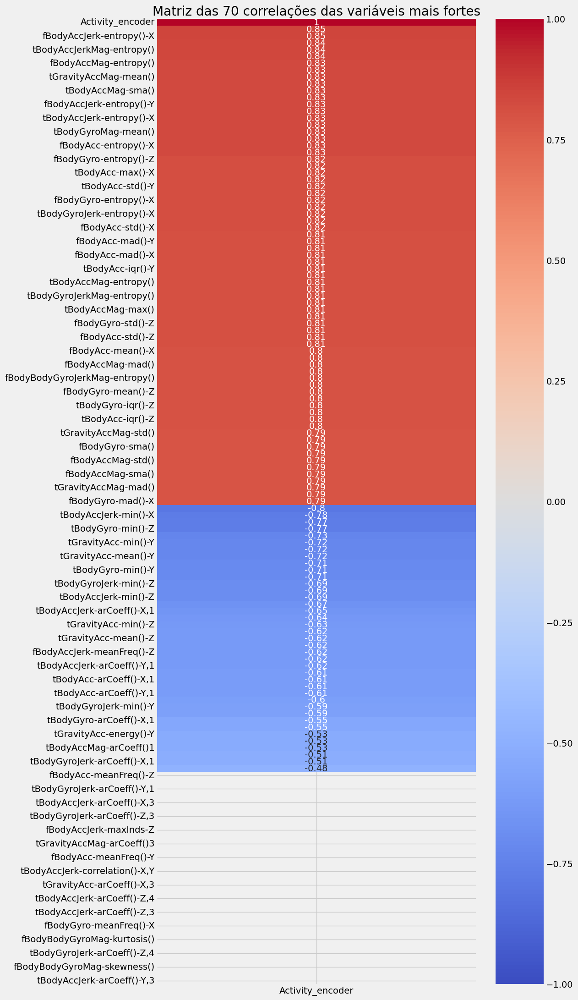

In [ ]:
#sns.heatmap(round(df.corr()[['Activity_encoder']].sort_values(by='Activity_encoder', ascending=False).head(10),2), annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm')
plt.figure(figsize=(10,26))
sns.heatmap(top_correlation, annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm')
plt.title("Matriz das 70 correlações das variáveis mais fortes");


In [ ]:
print(top_correlation.index)

Index(['Activity_encoder', 'tBodyGyroJerk-entropy()-Z',
       'fBodyAccJerk-entropy()-X', 'tBodyAccJerk-entropy()-Y',
       'tBodyAccJerkMag-entropy()', 'tBodyAcc-sma()', 'fBodyAccMag-entropy()',
       'tBodyAccMag-mean()', 'tGravityAccMag-mean()', 'tGravityAccMag-sma()',
       ...
       'fBodyAccJerk-maxInds-Y', 'fBodyGyro-meanFreq()-X',
       'tBodyAcc-arCoeff()-Z,3', 'fBodyBodyGyroMag-kurtosis()',
       'tBodyAccJerk-correlation()-X,Z', 'tBodyGyroJerk-arCoeff()-Z,4',
       'tBodyGyro-arCoeff()-Y,3', 'fBodyBodyGyroMag-skewness()',
       'tGravityAcc-arCoeff()-Z,3', 'tBodyAccJerk-arCoeff()-Y,3'],
      dtype='object', length=141)


## NORMALIZAÇÃO

In [ ]:
df_features = df.drop(columns=['Activity', 'Activity_encoder'])
df_target = df.Activity
# padronizador = StandardScaler() # normalizador
# padronizador = RobustScaler() # bom para remover outliers
padronizador = MinMaxScaler(feature_range=(0,1)) #range 0 a 1
padronizador.fit(df_features)
df_features2 = padronizador.transform(df_features)
df_features2 = pd.DataFrame(df_features2,
                            columns=df_features.columns)

dados_plot  = pd.concat([df_target, df_features2.iloc[:, :3]], axis=1)
dados_plot

,Activity,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z
0,STANDING,0.644292,0.489853,0.433547
1,STANDING,0.639209,0.491795,0.438240
2,STANDING,0.639827,0.490266,0.443269
3,STANDING,0.639587,0.486900,0.438359
4,STANDING,0.638314,0.491715,0.442319
...,...,...,...,...
10294,WALKING_UPSTAIRS,0.655077,0.473304,0.450446
10295,WALKING_UPSTAIRS,0.681692,0.480393,0.447042
10296,WALKING_UPSTAIRS,0.674983,0.515039,0.442106
10297,WALKING_UPSTAIRS,0.618797,0.509233,0.451751


In [ ]:

dados_plot = pd.melt(dados_plot, id_vars='Activity',
                     var_name='medicoes',
                     value_name='valores'
)
dados_plot.head()

,Activity,medicoes,valores
0,STANDING,tBodyAcc-mean()-X,0.644292
1,STANDING,tBodyAcc-mean()-X,0.639209
2,STANDING,tBodyAcc-mean()-X,0.639827
3,STANDING,tBodyAcc-mean()-X,0.639587
4,STANDING,tBodyAcc-mean()-X,0.638314


(array([0, 1, 2]),
 [Text(0, 0, 'tBodyAcc-mean()-X'),
  Text(1, 0, 'tBodyAcc-mean()-Y'),
  Text(2, 0, 'tBodyAcc-mean()-Z')])

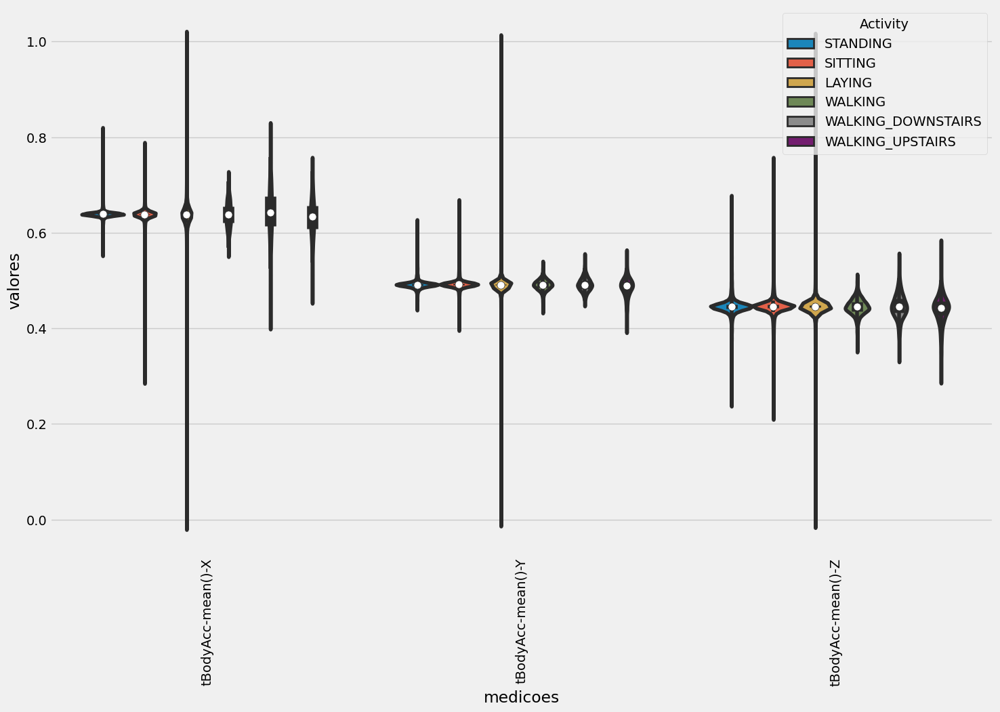

In [ ]:

plt.figure(figsize=(16,10))
sns.violinplot(x = 'medicoes', y='valores', hue='Activity', data=dados_plot, split=False) # so usar split para duas classes
plt.xticks(rotation=90)

### Analisando o quando a coluna possui variação de valores

In [ ]:
#seleciona somente as colunas que possuem desvio padrao maior que 0.7(valor veio da cabeça)
df_features.loc[:, df_features.std() > 0.7]

,"tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerkMag-entropy(),fBodyAcc-entropy()-X,fBodyAccJerk-entropy()-X,fBodyAccJerk-entropy()-Y
0,0.439027,0.986913,-0.863415,-0.946357,-1.000000,-1.000000
1,-0.865711,0.974386,-0.819928,-1.000000,-1.000000,-1.000000
2,0.337936,0.643417,-0.794884,-1.000000,-1.000000,-1.000000
3,-0.968821,0.984256,-0.792321,-1.000000,-1.000000,-1.000000
4,-0.184840,0.964797,-0.850026,-1.000000,-1.000000,-1.000000
...,...,...,...,...,...,...
10294,-0.754297,-0.815627,0.579068,0.426656,0.439936,0.277066
10295,-0.752336,-0.930187,0.643984,0.611024,0.486474,0.394316
10296,-0.495111,-0.898046,0.600790,0.566462,0.406943,0.351133
10297,-0.146284,-0.884900,0.599803,0.496858,0.285182,0.182878


In [ ]:
df_std = df_features.std() > 0.3
df_std

tBodyAcc-mean()-X                       False
tBodyAcc-mean()-Y                       False
tBodyAcc-mean()-Z                       False
tBodyAcc-std()-X                         True
tBodyAcc-std()-Y                         True
                                        ...  
angle(tBodyGyroMean,gravityMean)         True
angle(tBodyGyroJerkMean,gravityMean)     True
angle(X,gravityMean)                     True
angle(Y,gravityMean)                     True
angle(Z,gravityMean)                    False
Length: 561, dtype: bool

In [ ]:
df_f_std = df_features.loc[:, df_features.std() > 0.7]

In [ ]:
# padronizador = StandardScaler() # normalizador
# padronizador = RobustScaler() # bom para remover outliers
padronizador = MinMaxScaler(feature_range=(0,1)) #range 0 a 1
padronizador.fit(df_f_std)
df_features2 = padronizador.transform(df_f_std)
df_features2 = pd.DataFrame(df_features2,
                            columns=df_f_std.columns)

dados_plot  = pd.concat([df_target, df_features2], axis=1)
dados_plot

,Activity,"tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerkMag-entropy(),fBodyAcc-entropy()-X,fBodyAccJerk-entropy()-X,fBodyAccJerk-entropy()-Y
0,STANDING,0.719514,0.993457,0.068293,0.026822,0.000000,0.000000
1,STANDING,0.067144,0.987193,0.090036,0.000000,0.000000,0.000000
2,STANDING,0.668968,0.821708,0.102558,0.000000,0.000000,0.000000
3,STANDING,0.015589,0.992128,0.103839,0.000000,0.000000,0.000000
4,STANDING,0.407580,0.982398,0.074987,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
10294,WALKING_UPSTAIRS,0.122852,0.092186,0.789534,0.713328,0.719968,0.638533
10295,WALKING_UPSTAIRS,0.123832,0.034906,0.821992,0.805512,0.743237,0.697158
10296,WALKING_UPSTAIRS,0.252444,0.050977,0.800395,0.783231,0.703471,0.675567
10297,WALKING_UPSTAIRS,0.426858,0.057550,0.799901,0.748429,0.642591,0.591439


In [ ]:

dados_plot = pd.melt(dados_plot, id_vars='Activity',
                     var_name='medicoes',
                     value_name='valores'
)
dados_plot.head()

,Activity,medicoes,valores
0,STANDING,"tGravityAcc-correlation()-X,Z",0.719514
1,STANDING,"tGravityAcc-correlation()-X,Z",0.067144
2,STANDING,"tGravityAcc-correlation()-X,Z",0.668968
3,STANDING,"tGravityAcc-correlation()-X,Z",0.015589
4,STANDING,"tGravityAcc-correlation()-X,Z",0.407580


(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'tGravityAcc-correlation()-X,Z'),
  Text(1, 0, 'tGravityAcc-correlation()-Y,Z'),
  Text(2, 0, 'tBodyAccJerkMag-entropy()'),
  Text(3, 0, 'fBodyAcc-entropy()-X'),
  Text(4, 0, 'fBodyAccJerk-entropy()-X'),
  Text(5, 0, 'fBodyAccJerk-entropy()-Y')])

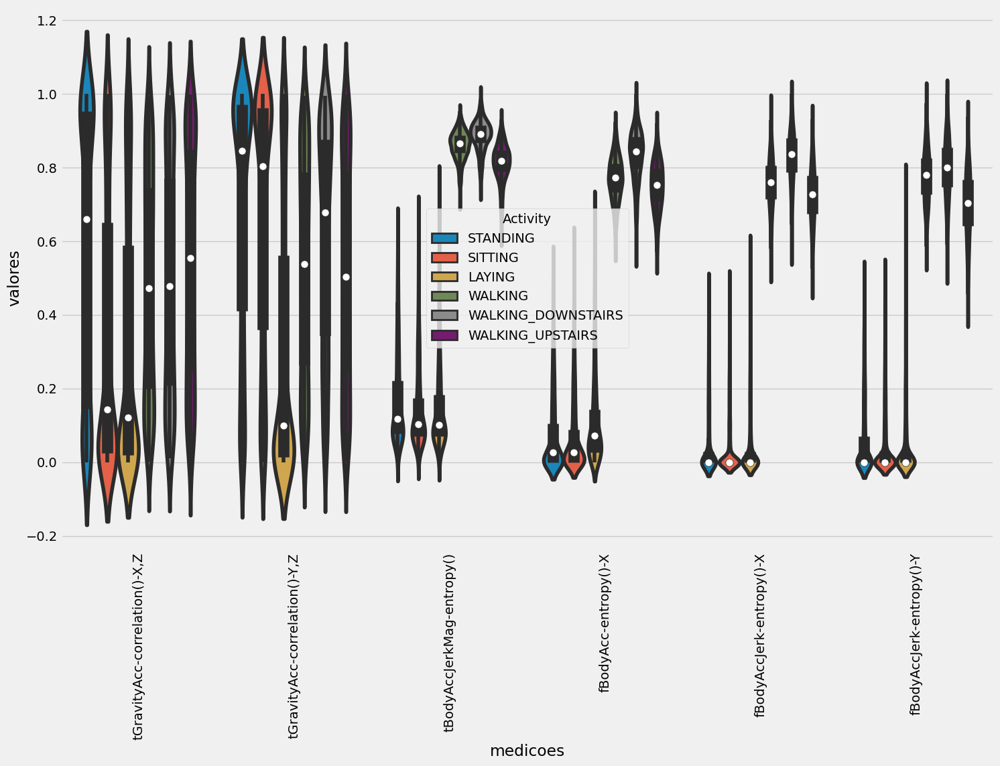

In [ ]:

plt.figure(figsize=(16,10))
sns.violinplot(x = 'medicoes', y='valores', hue='Activity', data=dados_plot, split=False) # so usar split para duas classes
plt.xticks(rotation=90)

In [ ]:
df.describe().T.columns

Index(['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max'], dtype='object')

In [ ]:
pd.DataFrame([i[0] for i in [w.split('-') for w in list(df.columns)] ]).value_counts()

fBodyAcc                                79
fBodyAccJerk                            79
fBodyGyro                               79
tGravityAcc                             40
tBodyGyroJerk                           40
tBodyGyro                               40
tBodyAccJerk                            40
tBodyAcc                                40
fBodyBodyGyroJerkMag                    13
fBodyBodyGyroMag                        13
tBodyGyroMag                            13
tBodyGyroJerkMag                        13
tBodyAccMag                             13
tBodyAccJerkMag                         13
tGravityAccMag                          13
fBodyBodyAccJerkMag                     13
fBodyAccMag                             13
Activity_encoder                         1
angle(tBodyGyroMean,gravityMean)         1
angle(tBodyGyroJerkMean,gravityMean)     1
angle(tBodyAccMean,gravity)              1
angle(tBodyAccJerkMean),gravityMean)     1
angle(Z,gravityMean)                     1
angle(Y,gra

In [ ]:
df_t = df.describe().T

In [ ]:
df_t.columns = ['contador', 'media', 'desvio', 'min', '25%', '50%', '75%', 'max']

In [ ]:
df_t[df_t['contador'] < 10299]

,contador,media,desvio,min,25%,50%,75%,max


In [ ]:
df_t[df_t['contador'] < 10299]

,contador,media,desvio,min,25%,50%,75%,max


In [ ]:
# padronizando os dados com standarscaler


scaling = StandardScaler()
scaling.fit(df_features)
scaled_data = scaling.transform(df_features)

principal = PCA(n_components=3)
principal.fit(scaled_data)
x = principal.transform(scaled_data)

print(x.shape)


(10299, 3)


In [ ]:
principal.components_

array([[ 0.00032202, -0.00265502, -0.00183102, ..., -0.02322551,
         0.028696  ,  0.02622314],
       [ 0.01667862,  0.00050924, -0.00496277, ...,  0.0248285 ,
        -0.04036438, -0.02188039],
       [-0.03345017,  0.00185376,  0.0090155 , ...,  0.09272479,
        -0.06636099, -0.04427172]])

In [ ]:
df_target.factorize()[0]

array([0, 0, 0, ..., 5, 5, 5])

Text(0, 0.5, 'pc2')

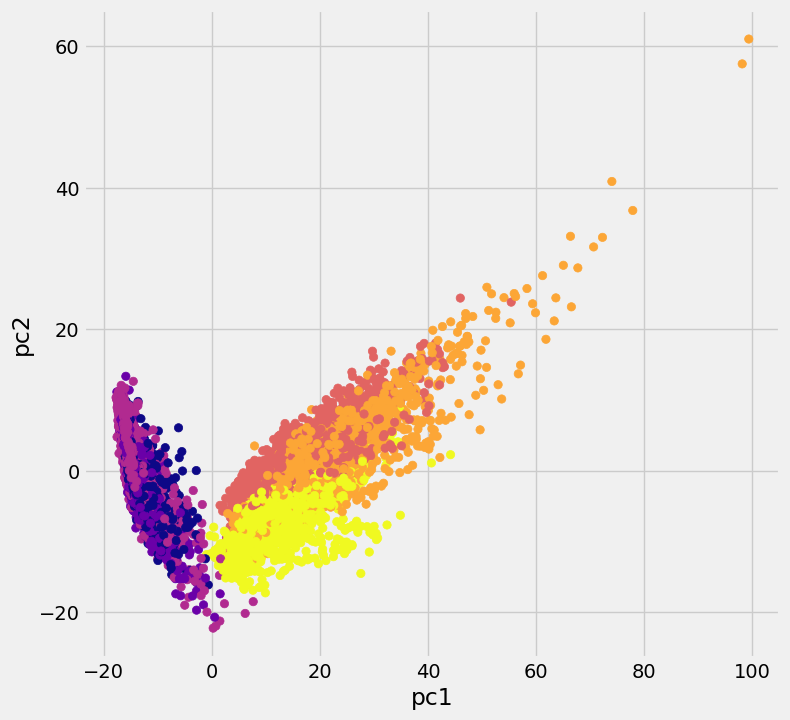

In [ ]:
plt.figure(figsize=(8,8))
plt.scatter(x[:,0], x[:,1], c = df_target.factorize()[0], cmap='plasma')
plt.xlabel('pc1')
plt.ylabel('pc2')

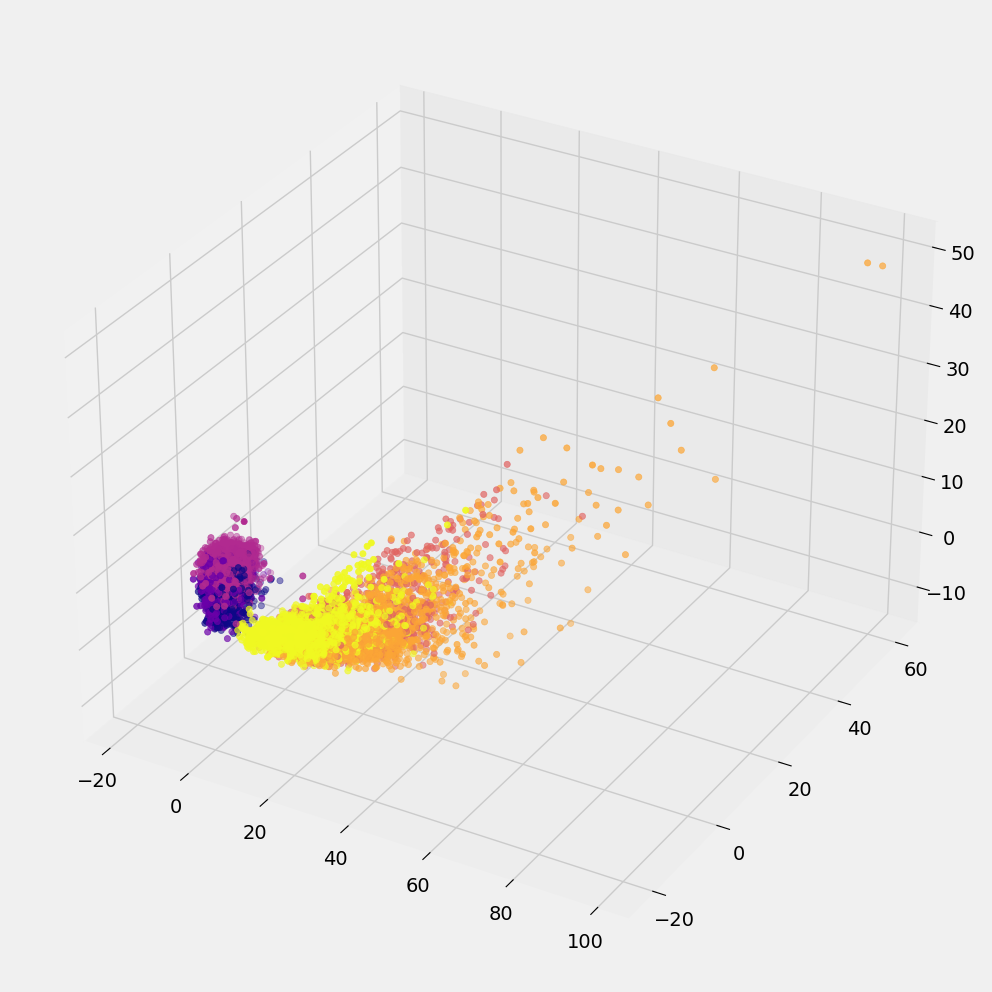

In [ ]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')

ax.scatter(x[:,0], x[:,1], x[:,2], c = df_target.factorize()[0], cmap='plasma')
plt.show()

### Análise de correlação (Segunda Abordagem)

In [ ]:
c = df.corr().abs()


<ipython-input-770-8aca4df4a1bd>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  c = df.corr().abs()


In [ ]:
c[c != 'NaN'].head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Activity_encoder
tBodyAcc-mean()-X,1.000000,0.128037,0.230302,0.004590,0.016785,0.036071,0.010303,0.017488,0.038805,0.046943,...,0.006179,0.002255,0.552989,0.015754,0.036047,0.034296,0.041021,0.034053,0.030656,0.009163
tBodyAcc-mean()-Y,0.128037,1.000000,0.029882,0.046352,0.046996,0.054153,0.045247,0.047673,0.055524,0.039445,...,0.000649,0.002842,0.077750,0.027567,0.013241,0.077627,0.007513,0.005616,0.016233,0.063079
tBodyAcc-mean()-Z,0.230302,0.029882,1.000000,0.024185,0.023745,0.015632,0.022872,0.022966,0.009577,0.040218,...,0.023050,0.023122,0.055020,0.042083,0.066233,0.030748,0.003215,0.012986,0.028406,0.061197
tBodyAcc-std()-X,0.004590,0.046352,0.024185,1.000000,0.922525,0.861910,0.998662,0.916087,0.856497,0.981226,...,0.165552,0.135171,0.034334,0.017096,0.027464,0.027123,0.374104,0.449425,0.393063,0.816037
tBodyAcc-std()-Y,0.016785,0.046996,0.023745,0.922525,1.000000,0.888259,0.918561,0.997510,0.887052,0.911137,...,0.220279,0.191164,0.020806,0.006605,0.001902,0.015784,0.381391,0.506106,0.425511,0.820702


In [ ]:
matr_alta_corr = c[c > 0.99]

In [ ]:
sum_mat_alt_corr = matr_alta_corr.sum().sort_values(ascending=False)
sum_mat_alt_corr

tGravityAccMag-std()               7.966144
tBodyAccMag-std()                  7.966144
fBodyAccJerk-sma()                 7.959273
tBodyAccJerkMag-mad()              7.957189
tBodyAccJerkMag-std()              6.973388
                                     ...   
tBodyAccJerkMag-max()              1.000000
tBodyGyroJerk-correlation()-Y,Z    1.000000
tBodyGyroJerk-correlation()-X,Z    1.000000
tBodyGyroJerk-correlation()-X,Y    1.000000
Activity_encoder                   1.000000
Length: 562, dtype: float64

In [ ]:
variaveis_correlacionadas = sum_mat_alt_corr[sum_mat_alt_corr > 1]
variaveis_correlacionadas

tGravityAccMag-std()            7.966144
tBodyAccMag-std()               7.966144
fBodyAccJerk-sma()              7.959273
tBodyAccJerkMag-mad()           7.957189
tBodyAccJerkMag-std()           6.973388
                                  ...   
angle(X,gravityMean)            1.990372
fBodyAcc-mad()-Z                1.990309
fBodyAcc-entropy()-X            1.990276
fBodyAcc-bandsEnergy()-17,24    1.990013
fBodyAcc-bandsEnergy()-17,32    1.990013
Length: 183, dtype: float64

In [ ]:
# Forma errada, pois deve deixar pelo menos uma de cada par/grupo de correlacionados
# Pode ser escolhido ol
df_sem_corr = df.drop(columns=variaveis_correlacionadas.keys())
df_sem_corr.head()


,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-energy()-Y,...,fBodyBodyGyroJerkMag-maxInds,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)",Activity,Activity_encoder
0,0.288585,-0.020294,-0.132905,-0.934724,-0.567378,-0.744413,0.852947,0.685845,0.814263,-0.999863,...,-1.000000,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,STANDING,2
1,0.278419,-0.016411,-0.123520,-0.943068,-0.557851,-0.818409,0.849308,0.685845,0.822637,-0.999788,...,-1.000000,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,STANDING,2
2,0.279653,-0.019467,-0.113462,-0.938692,-0.557851,-0.818409,0.843609,0.682401,0.839344,-0.999660,...,-0.555556,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,STANDING,2
3,0.279174,-0.026201,-0.123283,-0.938692,-0.576159,-0.829711,0.843609,0.682401,0.837869,-0.999736,...,-0.936508,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,STANDING,2
4,0.276629,-0.016570,-0.115362,-0.942469,-0.569174,-0.824705,0.849095,0.683250,0.837869,-0.999856,...,-0.936508,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,STANDING,2


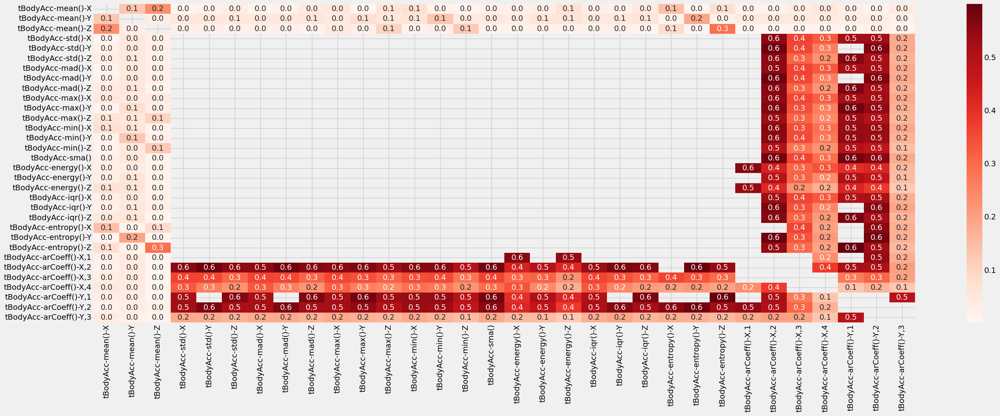

In [ ]:
filteredDf = c[(((c >= .0) & (c <= .6)) | ((c <= -.6) & (c >= -.0))) & (c !=1.000) & (c != 'NaN')]
plt.figure(figsize=(30,10))
sns.heatmap(filteredDf.iloc[:32,:32], annot=True, cmap="Reds", fmt='.1f')
plt.show()


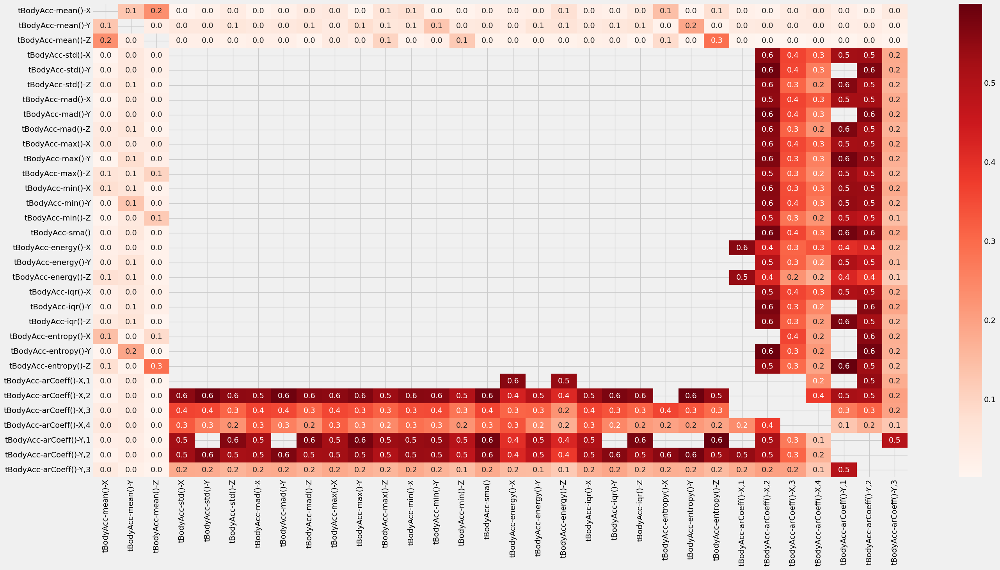

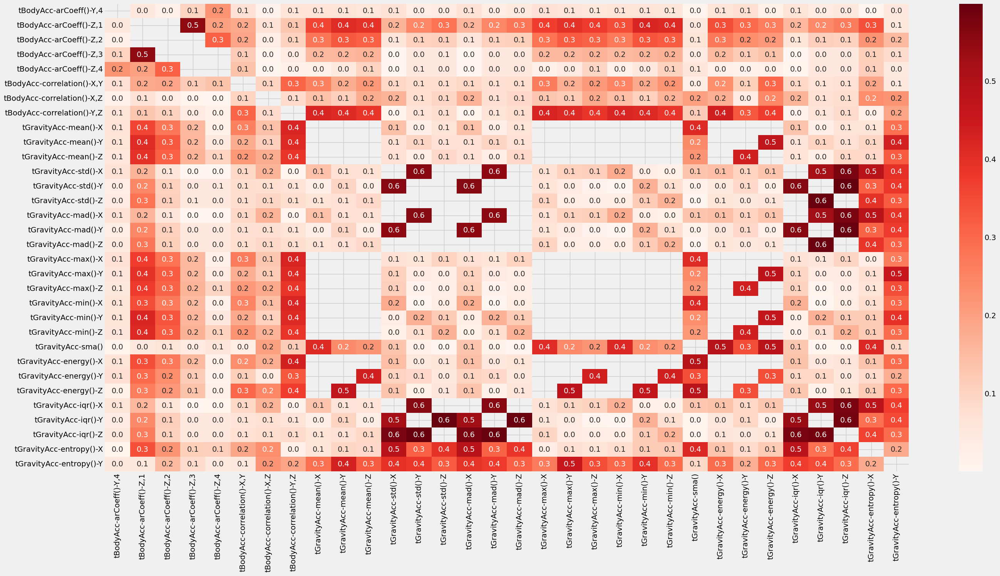

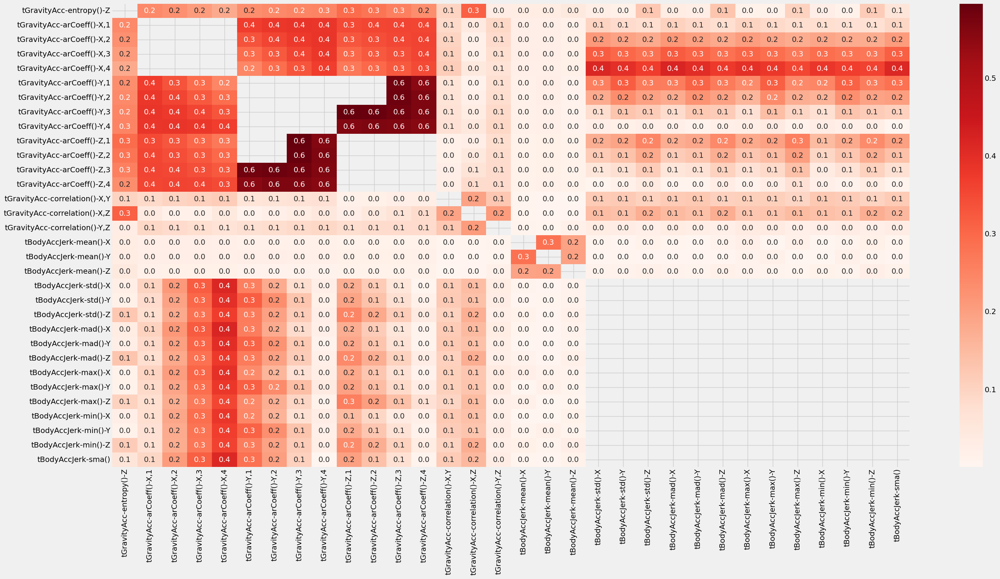

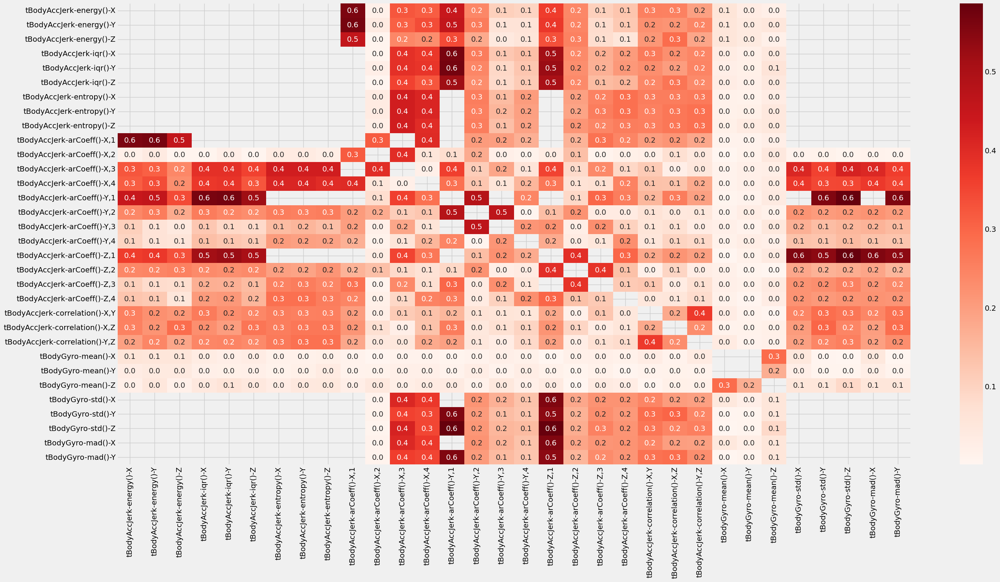

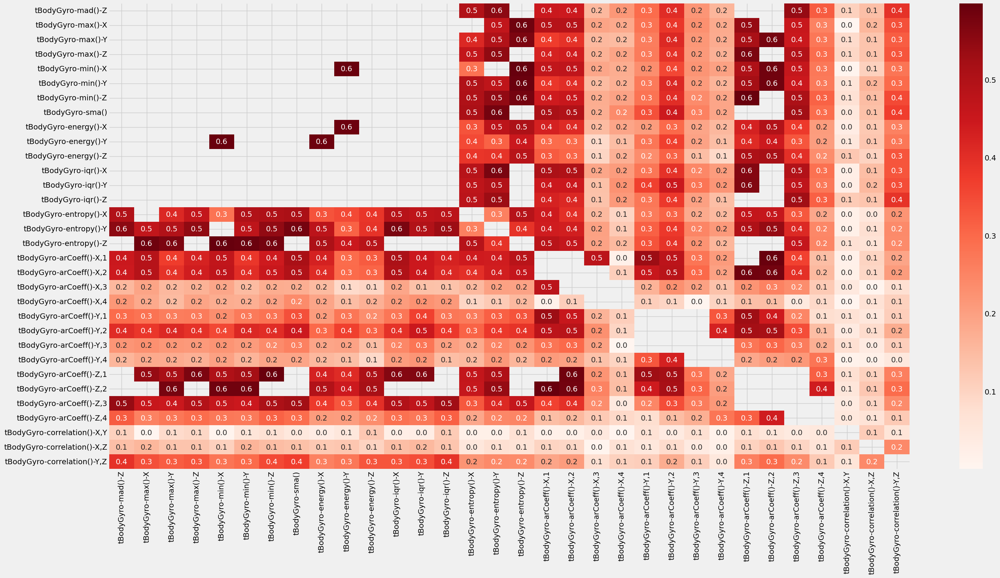

...

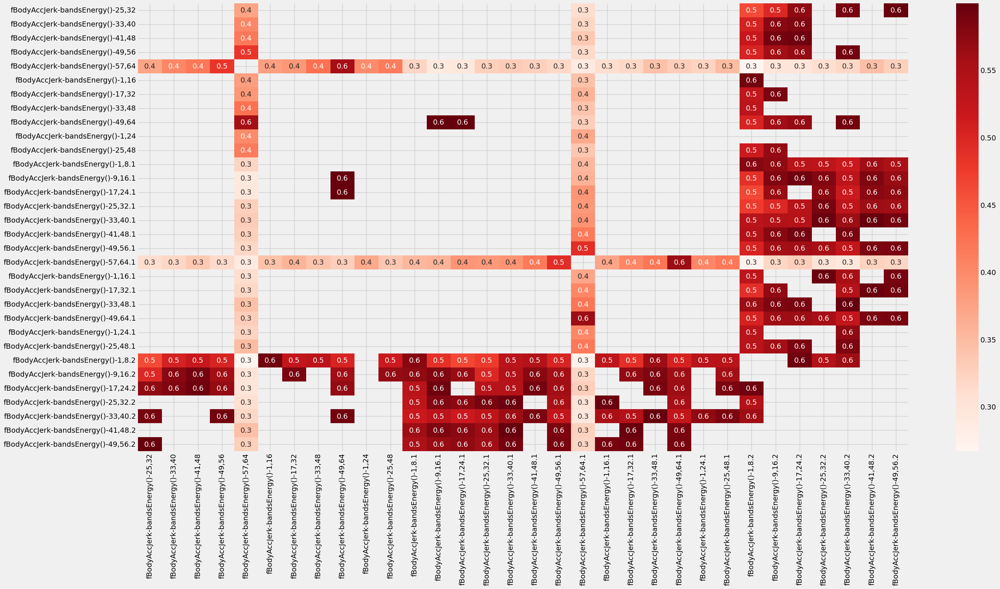

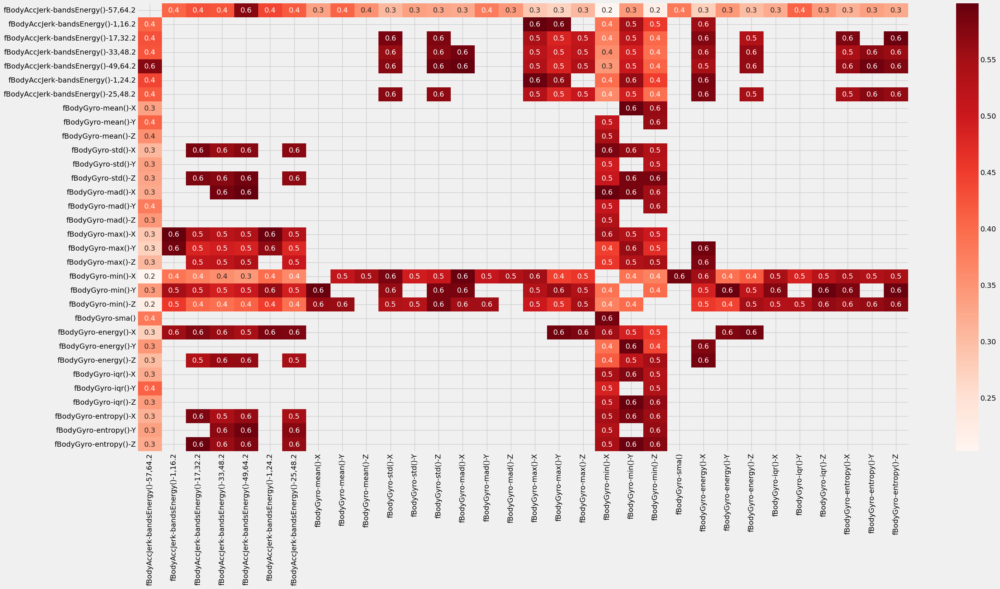

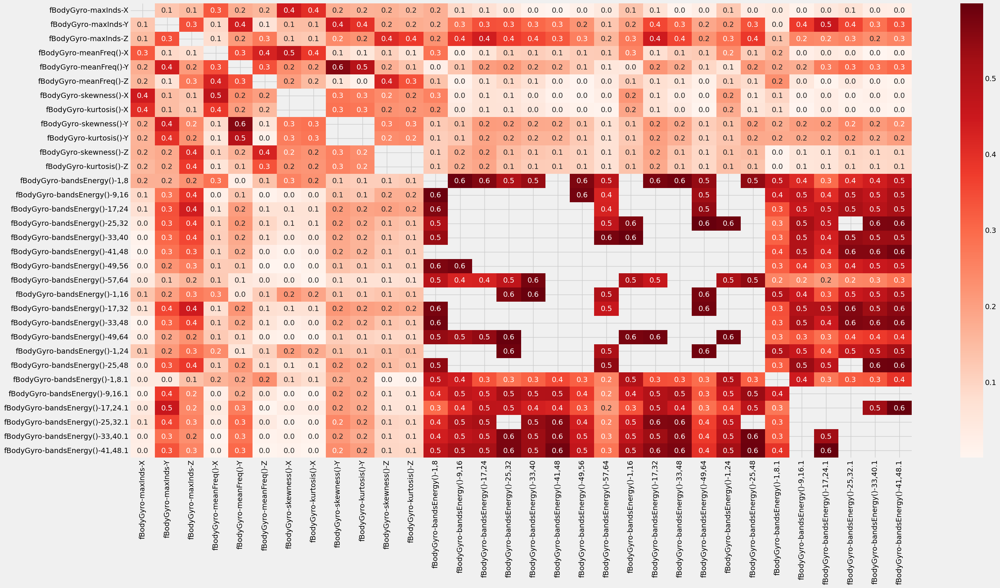

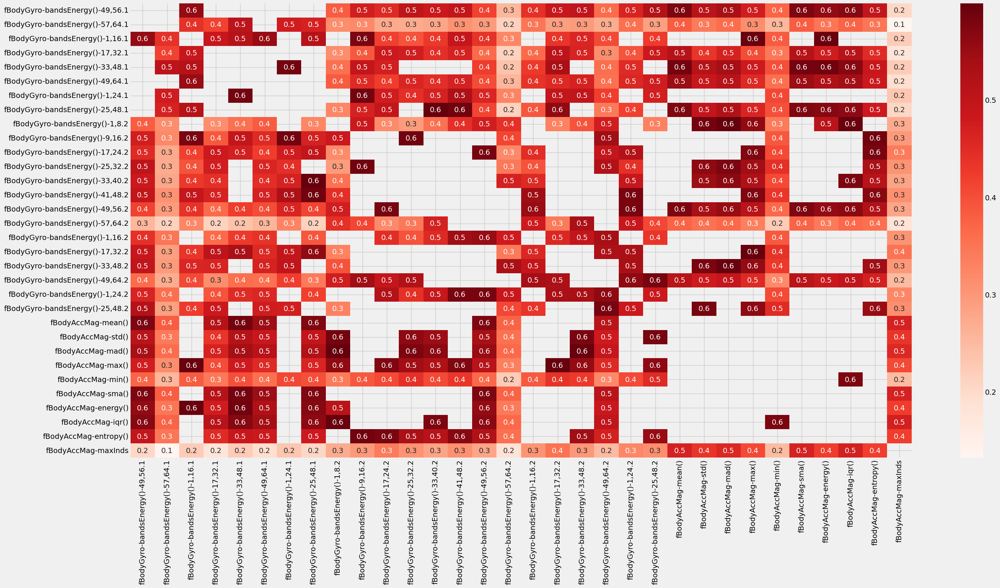

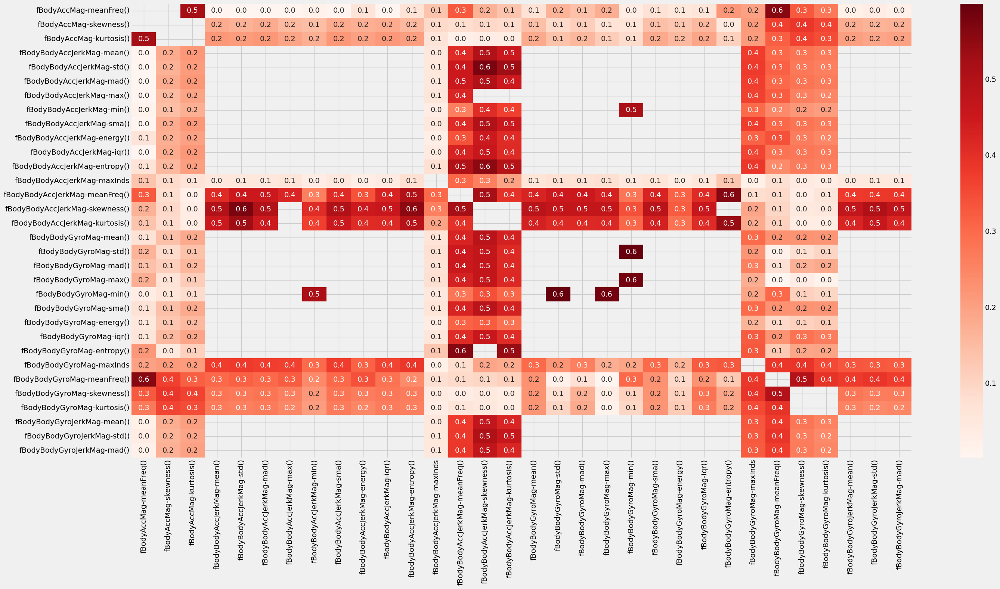

In [ ]:
for i in range(0, 529, 32):
  filteredDf = c[(((c >= .0) & (c <= .6)) | ((c <= -.6) & (c >= -.0))) & (c !=1.000) & (c != 'NaN')]
  plt.figure(figsize=(30,15))
  sns.heatmap(filteredDf.iloc[i:i+32,i:i+32], annot=True, cmap="Reds", fmt='.1f')
  plt.show()

In [ ]:
filteredDf.shape

(562, 562)

In [ ]:
filteredDf

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Activity_encoder
tBodyAcc-mean()-X,NaN,0.128037,0.230302,0.004590,0.016785,0.036071,0.010303,0.017488,0.038805,0.046943,...,0.006179,0.002255,0.552989,0.015754,0.036047,0.034296,0.041021,0.034053,0.030656,0.009163
tBodyAcc-mean()-Y,0.128037,NaN,0.029882,0.046352,0.046996,0.054153,0.045247,0.047673,0.055524,0.039445,...,0.000649,0.002842,0.077750,0.027567,0.013241,0.077627,0.007513,0.005616,0.016233,0.063079
tBodyAcc-mean()-Z,0.230302,0.029882,NaN,0.024185,0.023745,0.015632,0.022872,0.022966,0.009577,0.040218,...,0.023050,0.023122,0.055020,0.042083,0.066233,0.030748,0.003215,0.012986,0.028406,0.061197
tBodyAcc-std()-X,0.004590,0.046352,0.024185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.165552,0.135171,0.034334,0.017096,0.027464,0.027123,0.374104,0.449425,0.393063,NaN
tBodyAcc-std()-Y,0.016785,0.046996,0.023745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.220279,0.191164,0.020806,0.006605,0.001902,0.015784,0.381391,0.506106,0.425511,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"angle(tBodyGyroJerkMean,gravityMean)",0.034296,0.077627,0.030748,0.027123,0.015784,0.012196,0.027097,0.013411,0.012800,0.030908,...,0.013065,0.011829,0.027478,0.023605,0.112454,NaN,0.024822,0.004582,0.012549,0.002703
"angle(X,gravityMean)",0.041021,0.007513,0.003215,0.374104,0.381391,0.353271,0.371168,0.378013,0.355836,0.384244,...,0.085226,0.081971,0.008050,0.017534,0.007095,0.024822,NaN,NaN,NaN,NaN
"angle(Y,gravityMean)",0.034053,0.005616,0.012986,0.449425,0.506106,0.459092,0.444926,0.507947,0.460345,0.458832,...,0.087671,0.078010,0.003082,0.007256,0.006444,0.004582,NaN,NaN,0.545614,NaN
"angle(Z,gravityMean)",0.030656,0.016233,0.028406,0.393063,0.425511,0.483424,0.389481,0.424479,0.480032,0.402873,...,0.058759,0.054008,0.003242,0.013130,0.015380,0.012549,NaN,0.545614,NaN,NaN


In [ ]:
#pode usar argsort
s = filteredDf.unstack()
so = s.sort_values(kind="quicksort")

In [ ]:
so[(so > 0.0) & (so < 0.5) ]

tBodyGyroJerk-mean()-X            tBodyAccJerkMag-arCoeff()4          0.000003
tBodyAccJerkMag-arCoeff()4        tBodyGyroJerk-mean()-X              0.000003
tBodyAccMag-arCoeff()1            angle(tBodyGyroMean,gravityMean)    0.000005
angle(tBodyGyroMean,gravityMean)  tBodyAccMag-arCoeff()1              0.000005
                                  tGravityAccMag-arCoeff()1           0.000005
                                                                        ...   
tBodyAccJerk-arCoeff()-Z,1        tBodyGyroJerkMag-mean()             0.499991
tBodyGyroJerkMag-sma()            tBodyAccJerk-arCoeff()-Z,1          0.499991
tBodyGyroJerkMag-mean()           tBodyAccJerk-arCoeff()-Z,1          0.499991
tBodyAccJerkMag-min()             fBodyAccMag-min()                   0.499992
fBodyAccMag-min()                 tBodyAccJerkMag-min()               0.499992
Length: 184862, dtype: float64

In [ ]:
# dfCorr = df.corr()
# filteredDf = dfCorr[((dfCorr >= .5) | (dfCorr <= -.5)) & (dfCorr !=1.000)]
# plt.figure(figsize=(30,10))
# sns.heatmap(filteredDf, annot=True, cmap="Reds")
# plt.show()

### Tratamento de Outliers

In [ ]:
df_features.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,-0.466732,...,0.126708,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284
std,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,0.538707,...,0.245443,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,-0.935788,...,-0.019481,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880
50%,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,-0.874825,...,0.136245,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882
75%,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,-0.014641,...,0.288960,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
multiplicador = 3
d = df_features.quantile([0.25,0.5,0.75]).T
d.columns = ['PQ', 'MD', 'TQ']
d['IQR'] = d['TQ'] - d['PQ']
d['L_INF'] = d['PQ'] - multiplicador * d['IQR']
d['L_SUP'] = d['TQ'] + multiplicador * d['IQR']
d.loc['tBodyAcc-mean()-X', 'L_INF']
d.loc['tBodyAcc-mean()-X', 'L_SUP']
d.T

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
PQ,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,-0.935788,...,-0.019481,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880
MD,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,-0.874825,...,0.136245,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882
TQ,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,-0.014641,...,0.288960,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970
IQR,0.025729,0.014278,0.023430,0.742068,0.919655,0.700400,0.691261,0.889612,0.690915,0.921148,...,0.308441,0.423007,0.353867,0.273699,0.578521,1.029245,0.755037,0.295785,0.248639,0.234850
L_INF,0.185437,-0.067736,-0.191307,-3.218563,-3.735954,-3.080336,-3.067075,-3.645853,-3.051808,-3.699232,...,-0.944803,-1.805195,-1.903447,-0.945792,-2.022593,-3.580843,-2.654151,-1.704641,-0.743767,-0.836430
L_SUP,0.365543,0.032209,-0.027301,1.975910,2.701628,1.822461,1.771750,2.581432,1.784595,2.748803,...,1.214282,1.155854,0.573619,0.970103,2.027053,3.623871,2.631106,0.365850,0.996708,0.807520


In [ ]:
((df_features['angle(X,gravityMean)'] > 1) | (df_features['angle(X,gravityMean)'] < 2)).sum()

10299

In [ ]:
df_outliers = pd.DataFrame([], columns=['nome_coluna', 'qtd_outliers'])
for col in df_features.columns:
  l_inf = d.loc[col, 'L_INF']
  l_sup = d.loc[col, 'L_SUP']

  qtd_out = ((df_features[col] > l_sup) | (df_features[col] < l_inf)).sum()
  df_outliers = pd.concat([df_outliers, pd.Series({'nome_coluna':col,
                                    'qtd_outliers':qtd_out}).to_frame().T]
                                    , ignore_index=True)
#   print(col)
#   d.loc['tBodyAcc-mean()-X', 'L_INF']
# d.loc['tBodyAcc-mean()-X', 'L_SUP']
df_outliers[df_outliers['qtd_outliers'] > 0].sort_values(by='qtd_outliers', ascending=False)

,nome_coluna,qtd_outliers
80,tBodyAccJerk-mean()-X,3111
120,tBodyGyro-mean()-X,2561
160,tBodyGyroJerk-mean()-X,2085
49,tGravityAcc-max()-X,1985
40,tGravityAcc-mean()-X,1976
...,...,...
346,fBodyAccJerk-mean()-Z,1
129,tBodyGyro-max()-X,1
243,tBodyGyroMag-min(),1
535,fBodyBodyGyroMag-iqr(),1


In [ ]:
df_outliers[df_outliers['qtd_outliers'] <= 0]

,nome_coluna,qtd_outliers
3,tBodyAcc-std()-X,0
4,tBodyAcc-std()-Y,0
5,tBodyAcc-std()-Z,0
6,tBodyAcc-mad()-X,0
7,tBodyAcc-mad()-Y,0
...,...,...
549,fBodyBodyGyroJerkMag-entropy(),0
552,fBodyBodyGyroJerkMag-skewness(),0
555,"angle(tBodyAccJerkMean),gravityMean)",0
556,"angle(tBodyGyroMean,gravityMean)",0


In [ ]:
df_outliers[df_outliers['qtd_outliers'] > df_outliers['qtd_outliers'].mean()]

,nome_coluna,qtd_outliers
0,tBodyAcc-mean()-X,1124
1,tBodyAcc-mean()-Y,558
2,tBodyAcc-mean()-Z,581
40,tGravityAcc-mean()-X,1976
43,tGravityAcc-std()-X,352
...,...,...
537,fBodyBodyGyroMag-maxInds,292
547,fBodyBodyGyroJerkMag-energy(),429
550,fBodyBodyGyroJerkMag-maxInds,265
558,"angle(X,gravityMean)",1670


<Axes: >

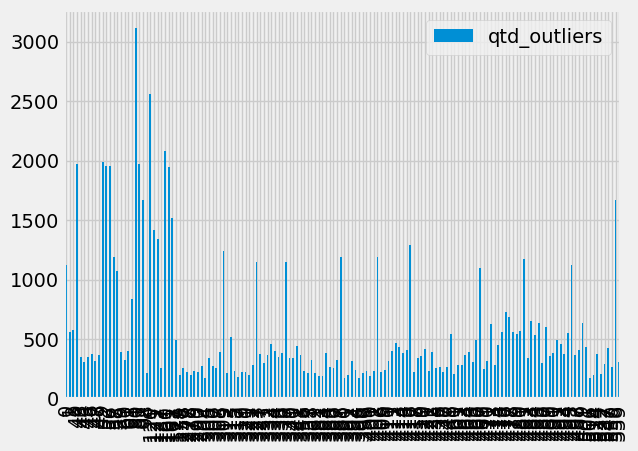

In [ ]:
df_outliers[df_outliers['qtd_outliers'] > df_outliers['qtd_outliers'].mean()].plot(kind='bar')

In [ ]:
cols_high_out = df_outliers[df_outliers['qtd_outliers'] > df_outliers['qtd_outliers'].mean()].nome_coluna
cols_high_out = list(cols_high_out)
df_features[cols_high_out].describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tGravityAcc-mean()-X,tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,...,"fBodyGyro-bandsEnergy()-25,48.2",fBodyAccMag-min(),fBodyAccMag-kurtosis(),fBodyBodyAccJerkMag-maxInds,fBodyBodyGyroMag-min(),fBodyBodyGyroMag-maxInds,fBodyBodyGyroJerkMag-energy(),fBodyBodyGyroJerkMag-maxInds,"angle(X,gravityMean)","angle(Y,gravityMean)"
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,0.274347,-0.017743,-0.108925,0.669226,-0.965207,-0.954408,-0.938901,-0.966018,-0.955361,-0.940206,...,-0.966368,-0.890588,-0.632129,-0.877800,-0.888701,-0.886999,-0.937898,-0.900033,-0.496522,0.063255
std,0.067628,0.037128,0.053033,0.515486,0.077715,0.085287,0.101555,0.076198,0.084234,0.100521,...,0.071400,0.160814,0.319531,0.189655,0.163587,0.159981,0.128284,0.139691,0.511158,0.305468
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.262625,-0.024902,-0.121019,0.811740,-0.994945,-0.991299,-0.986581,-0.994998,-0.991525,-0.986883,...,-0.999946,-0.991602,-0.844026,-0.968254,-0.993815,-1.000000,-0.999946,-0.968254,-0.817288,0.002151
50%,0.277174,-0.017162,-0.108596,0.921793,-0.981853,-0.975877,-0.966544,-0.982617,-0.976645,-0.967571,...,-0.998823,-0.969250,-0.734479,-0.904762,-0.959151,-0.948718,-0.998043,-0.904762,-0.715631,0.182028
75%,0.288354,-0.010625,-0.097589,0.954667,-0.961535,-0.946429,-0.929570,-0.962755,-0.947766,-0.931502,...,-0.959181,-0.838797,-0.535868,-0.873016,-0.839875,-0.846154,-0.922682,-0.873016,-0.521503,0.250790
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **MODELOS**

#### **Configuração 0**

RANDOM FOREST - com os 562 atributos fornecidos

In [ ]:
fixa_seed()
# df_features = df.iloc[:, :-1]
df_features = df.drop(columns=['Activity','Activity_encoder'])
# df_target = df.iloc[:, -1]
df_target = df.Activity
x_treino, x_teste, y_treino, y_teste = train_test_split(df_features,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )


In [ ]:
rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino, y_treino)
acuracia = rf_modelo.score(x_teste, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 97.48%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 97.47572815533981, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


#### **Configuração 1**

RANDOM FOREST - com redução de Dimensionalidade - PCA

In [ ]:
# padronizando os dados com standarscaler
def gera_pca(data, atributos, n):
  scaling = StandardScaler()
  scaling.fit(data.loc[:, atributos])
  scaled_data = scaling.transform(data.loc[:, atributos])

  principal = PCA(n_components=n)
  principal.fit(scaled_data)
  return principal.transform(scaled_data)



In [ ]:
new_dim = gera_pca(df, top_correlation.index.delete(0), 60)

In [ ]:
print(new_dim.shape)

(10299, 60)


In [ ]:
fixa_seed()
df_features_dim = new_dim
df_target = df.Activity
x_treino_dim, x_teste_dim, y_treino_dim, y_teste_dim = train_test_split(df_features_dim,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )

In [ ]:

rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino_dim, y_treino_dim)
acuracia = rf_modelo.score(x_teste_dim, y_teste_dim)*100
print("Acuracia modelo Random Forest com Redução de Dimensionalidade PCA: %.2f%%" %(acuracia))

Acuracia modelo Random Forest com Redução de Dimensionalidade PCA: 93.43%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 93.43042071197411, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


RANDOM FOREST - com seleção de atributo a partir do desvio padrão

#### **Configuração 2**

In [ ]:
fixa_seed()
# df_features = df.iloc[:, :-1]
#df_features = df_f_std#df_f_std.drop(columns=['Activity'])
df_features_std = df_features.loc[:, df_features.std() > 0.6]
# df_target = df.iloc[:, -1]
df_target = df.Activity
x_treino, x_teste, y_treino, y_teste = train_test_split(df_features_std,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )


In [ ]:
rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino, y_treino)
acuracia = rf_modelo.score(x_teste, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 91.39%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 91.3915857605178, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


## RFE - Eliminação recursiva de features
Ranking de atributos com remoção recursiva

São realizados treinamentos com cada vez menores conjuntos de atributos para obter os mais importantes, removendo os menos e ranqueando todos.

https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html




#### **Configuração 3**

In [ ]:
fixa_seed()
df_features = df.iloc[:, :-2]
#df_features = df_f_std#df_f_std.drop(columns=['Activity'])
#df_features_std = df_features.loc[:, df_features.std() > 0.6]
# df_target = df.iloc[:, -1]
df_target = df.Activity
x_treino, x_teste, y_treino, y_teste = train_test_split(df_features,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )


In [ ]:
# >>> X, y = load_digits(return_X_y=True)
# >>> X.shape
X = df_features #df.iloc[:, :-1]
y = df_target #df.iloc[:, -1]
scaler_kbest = MinMaxScaler(feature_range=(0,1))
scaler_kbest.fit(x_treino)
x_treino_minmax = scaler_kbest.transform(x_treino)
x_teste_minmax = scaler_kbest.transform(x_teste) # validar se faz isso com o teste

In [ ]:
x_treino_minmax

array([[0.73171991, 0.49212797, 0.44982136, ..., 0.23724723, 0.44470161,
        0.38216725],
       [0.73408704, 0.49083331, 0.44324392, ..., 0.08440966, 0.60544505,
        0.49586595],
       [0.74980225, 0.49912035, 0.44658482, ..., 0.16101389, 0.65599722,
        0.53531961],
       ...,
       [0.73539232, 0.4917328 , 0.44630442, ..., 0.13436174, 0.54008861,
        0.41297009],
       [0.73550864, 0.48376162, 0.42708543, ..., 0.08160349, 0.60459942,
        0.50270705],
       [0.75342822, 0.48663896, 0.45049972, ..., 0.80436001, 0.23364431,
        0.26348214]])

In [ ]:
minmax_df

,x1,x2
0,0.803988,0.225862
1,0.744810,0.155849
2,0.805327,0.180756
3,0.743897,0.156524
4,0.903936,0.147765
...,...,...
1020,0.000000,0.873232
1021,0.191231,0.923515
1022,0.273010,0.799285
1023,0.100606,0.821936


In [ ]:
# >>> from sklearn.datasets import load_digits
# >>> X, y = load_digits(return_X_y=True)
# >>> X.shape
# X = df.iloc[:, :-1]
# y = df.iloc[:, -1]
# scaler_kbest = preprocessing.MinMaxScaler(feature_range=(0,1))
# minmax_df = scaler_kbest.fit_transform(X)
# minmax_df = pd.DataFrame(minmax_df, columns =['x1', 'x2'])
selector = SelectKBest(score_func=chi2, k = 20)
selector.fit(x_treino_minmax, y_treino)
x_treino_kbest = selector.transform(x_treino_minmax)
x_teste_kbest = selector.transform(x_teste_minmax)
features_names = selector.get_feature_names_out()
print(features_names)
print(x_treino_kbest.shape)


['x9' 'x57' 'x227' 'x228' 'x234' 'x268' 'x271' 'x272' 'x280' 'x287' 'x288'
 'x345' 'x350' 'x366' 'x367' 'x368' 'x510' 'x523' 'x549' 'x558']
(7209, 20)


In [ ]:
rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino_kbest, y_treino)
acuracia = rf_modelo.score(x_teste_kbest, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 89.55%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 89.54692556634303, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


#### **Configuração 4**

In [ ]:

rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino, y_treino)
acuracia = rf_modelo.score(x_teste, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))

Acuracia modelo Random Forest: 97.48%


In [ ]:
# from sklearn.datasets import make_friedman1
# from sklearn.svm import SVR
# X, y = make_friedman1(n_samples=50, n_features=10, random_state=0)
rf_modelo = RandomForestClassifier(n_estimators=10)
selector_rfe = RFE(rf_modelo, n_features_to_select=5, step=5, verbose=1)
selector_rfe = selector_rfe.fit(x_treino, y_treino)
x_treino_rfe = selector_rfe.transform(x_treino)
x_teste_rfe = selector_rfe.transform(x_teste)



Fitting estimator with 561 features.
Fitting estimator with 556 features.
Fitting estimator with 551 features.
Fitting estimator with 546 features.
Fitting estimator with 541 features.
Fitting estimator with 536 features.
Fitting estimator with 531 features.
Fitting estimator with 526 features.
Fitting estimator with 521 features.
Fitting estimator with 516 features.
Fitting estimator with 511 features.
Fitting estimator with 506 features.
Fitting estimator with 501 features.
Fitting estimator with 496 features.
Fitting estimator with 491 features.
Fitting estimator with 486 features.
Fitting estimator with 481 features.
Fitting estimator with 476 features.
Fitting estimator with 471 features.
Fitting estimator with 466 features.
Fitting estimator with 461 features.
Fitting estimator with 456 features.
Fitting estimator with 451 features.
Fitting estimator with 446 features.
Fitting estimator with 441 features.
Fitting estimator with 436 features.
Fitting estimator with 431 features.
F

In [ ]:
x_treino_rfe.shape, x_teste_rfe.shape

((7209, 5), (3090, 5))

In [ ]:
x_treino.loc[:, selector_rfe.support_]


,tBodyAcc-max()-X,tGravityAcc-mean()-X,tGravityAcc-min()-X,fBodyAcc-energy()-X,fBodyAccMag-energy()
6107,-0.940018,0.809836,0.831283,-0.999966,-0.999946
5292,-0.940565,0.964349,0.983076,-0.999970,-0.999785
152,-0.269518,0.903321,0.916175,-0.795042,-0.834307
8986,-0.369448,0.887717,0.904490,-0.844806,-0.746304
6131,-0.927294,-0.520186,-0.472096,-0.999866,-0.999882
...,...,...,...,...,...
8211,0.004529,0.922104,0.935338,-0.648644,-0.741812
5708,-0.929790,0.826525,0.785418,-0.991946,-0.392682
7228,-0.941988,0.926428,0.946751,-0.999976,-0.999796
5867,-0.937860,0.965988,0.979656,-0.999946,-0.997546


In [ ]:
selector_rfe.ranking_

array([112,  52, 108,  15,  49,  35,   9,  29,  54,   1,  70,  23,  56,
        70,  50,  77,  17,  32,  66,  35,  37,  96,  14,  42,  47,  71,
        29,  73,  30,  68,  86,  88,  84,  58,  99,  48,  27,   4,  12,
        16,   1,   3,   4,  65,  66, 102,  32,  63,  52,   8,   3,   8,
         1,   5,   9,  11,   3,   7,  16,  74,  59,  89,  14,  24, 103,
         5,  22,  14,  52,   6,   3,  12,  20,   7,   5,   5,  15,  39,
        39,  41, 107,  60,  97,  40,   6,  95,  33,  45,  62,  13,  63,
        26, 104,  57,  74,  98,  67,  46,  51, 113,  79,  74,  17, 110,
        49, 107,  87,  91, 110,  52,  99,  87,  34,  31,  76,  52, 101,
        20,  36,  85,  15,  58,  93,  15,  10,  19,   2,  78,  13,   6,
        67,  50,  21,  94,  44,  60,  21,  40,  19,  21,  22,  22,  11,
        66,  37,  31, 107,  71,  53,  72,  96,  53,  75,  61,  96,  69,
        59,  17,  24,  11,  85,  93,  49,   7, 113,  71,  18,  68, 112,
        27,  86,  45,  31,  59,  82,  98,  23,  60,  81,   4,  6

In [ ]:
rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino_rfe, y_treino)
acuracia = rf_modelo.score(x_teste_rfe, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 83.66%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 83.65695792880258, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


## RFECV
Recursive feature elimination with cross-validation to select features.
https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html

#### **Configuração 5**

In [ ]:
# from sklearn.datasets import make_friedman1
# from sklearn.svm import SVR
# X, y = make_friedman1(n_samples=50, n_features=10, random_state=0)
rf_modelo = RandomForestClassifier(n_estimators=10)
selector_rfecv = RFECV(rf_modelo, step=10, cv=5, verbose=1)
selector_rfecv = selector_rfecv.fit(x_treino, y_treino)
x_treino_rfecv = selector_rfecv.transform(x_treino)
x_teste_rfecv = selector_rfecv.transform(x_teste)

Fitting estimator with 561 features.
Fitting estimator with 551 features.
Fitting estimator with 541 features.
Fitting estimator with 531 features.
Fitting estimator with 521 features.
Fitting estimator with 511 features.
Fitting estimator with 501 features.
Fitting estimator with 491 features.
Fitting estimator with 481 features.
Fitting estimator with 471 features.
Fitting estimator with 461 features.
Fitting estimator with 451 features.
Fitting estimator with 441 features.
Fitting estimator with 431 features.
Fitting estimator with 421 features.
Fitting estimator with 411 features.
Fitting estimator with 401 features.
Fitting estimator with 391 features.
Fitting estimator with 381 features.
Fitting estimator with 371 features.
Fitting estimator with 361 features.
Fitting estimator with 351 features.
Fitting estimator with 341 features.
Fitting estimator with 331 features.
Fitting estimator with 321 features.
Fitting estimator with 311 features.
Fitting estimator with 301 features.
F

In [ ]:
print(f"Colunas: {selector_rfecv.support_.sum()}")

Colunas: 161


In [ ]:
selector_rfecv.ranking_

array([ 1, 33, 30,  1,  8, 25,  1,  1, 34,  1,  4,  9,  9,  7, 38, 29,  9,
        1,  3,  1, 14, 38,  1,  1, 17, 15, 15, 33,  4, 36, 32, 41, 11, 23,
       22, 10, 10,  1,  1,  1,  1,  1,  1,  8, 16, 13, 12,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, 24, 40,  1,  1, 36,  1,  1,  1,
        7,  1,  1,  1,  1,  1,  1,  1,  1,  1, 12,  1, 35, 15, 29,  5,  1,
       28,  3, 12, 19,  1,  7,  9, 29, 24,  5, 22, 12, 13, 25, 36, 40, 27,
        1,  1, 26, 35, 27, 35, 25, 34,  4, 25,  4,  1, 32, 37,  8,  1, 12,
       24,  1,  8,  7,  1, 13,  3,  1,  1,  2,  1,  1, 31,  9, 33, 17, 20,
        1,  2,  1,  1, 28,  1,  1,  4, 12,  1, 31, 37, 24, 10,  3, 24, 19,
       37, 17, 10,  2,  1,  1,  1,  1, 21,  8,  1,  5, 12,  1,  1, 25, 11,
        7, 16,  1,  1, 39, 35,  1, 29, 23,  1, 16, 10, 33, 34,  1,  1, 15,
        7, 20,  1, 16, 30,  9, 14, 14, 28,  7,  3,  1, 22, 18,  1,  1,  1,
       18,  6, 18, 26, 26,  1, 11, 10,  1,  9,  1,  1,  1, 14,  2, 34, 37,
       39,  1,  1, 30, 13

In [ ]:
x_treino.loc[:,selector_rfecv.support_]

,tBodyAcc-mean()-X,tBodyAcc-std()-X,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-max()-X,tBodyAcc-energy()-Y,tBodyAcc-iqr()-X,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,"tBodyAcc-correlation()-X,Y",...,fBodyAccMag-meanFreq(),fBodyAccMag-skewness(),fBodyBodyAccJerkMag-max(),fBodyBodyGyroMag-std(),fBodyBodyGyroJerkMag-mad(),"angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
6107,0.272861,-0.995004,-0.995601,-0.993177,-0.940018,-0.999962,-0.996386,-0.725621,-0.625955,-0.309781,...,0.664171,-0.617338,-0.995103,-0.995758,-0.994259,0.395873,0.146149,-0.530881,-0.110703,-0.235751
5292,0.276566,-0.995482,-0.995704,-0.969712,-0.940565,-0.999733,-0.995619,-0.652548,-0.517331,-0.050878,...,0.188248,-0.363468,-0.991313,-0.967930,-0.993075,0.305378,-0.380865,-0.833093,0.210745,-0.008379
152,0.301162,-0.362666,-0.400837,-0.001549,-0.269518,-0.805660,-0.454749,0.558604,0.423459,-0.198230,...,-0.086578,-0.665822,-0.776271,0.106884,-0.619077,-0.904871,-0.524824,-0.681620,0.311837,0.070519
8986,0.237742,-0.445977,-0.475092,0.040471,-0.369448,-0.786271,-0.471229,0.381654,0.172788,-0.010783,...,0.210510,-0.503209,-0.333952,-0.411686,0.008568,-0.677304,-0.429881,-0.620567,0.269060,0.220916
6131,0.286850,-0.987387,-0.988006,-0.991923,-0.927294,-0.999955,-0.989323,-0.283448,-0.653228,0.195863,...,0.279157,-0.387167,-0.995486,-0.987510,-0.995234,0.107159,0.128724,0.624736,-0.300791,-0.713424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8211,0.292346,-0.164227,-0.216194,-0.207692,0.004529,-0.874950,-0.258285,0.309028,0.025707,-0.053013,...,0.107739,-0.349249,-0.242787,-0.500153,-0.488576,0.848325,0.395576,-0.748259,0.065531,0.197644
5708,0.097190,-0.877094,-0.873356,0.223294,-0.929790,-0.637932,-0.861399,-0.526943,0.422922,-0.959385,...,-0.351893,0.424887,-0.936004,-0.906316,-0.979050,-0.163697,0.149800,-0.631376,-0.068756,-0.182367
7228,0.278609,-0.996161,-0.996286,-0.984232,-0.941988,-0.999889,-0.996512,-0.615318,-0.565651,-0.158680,...,0.121512,-0.512102,-0.995565,-0.986409,-0.997526,-0.113208,0.239004,-0.734321,0.080048,-0.174152
5867,0.278791,-0.993050,-0.993505,-0.935597,-0.937860,-0.998631,-0.993787,-0.523531,-0.627899,-0.541014,...,-0.121298,0.725125,-0.992045,-0.975307,-0.993350,0.066183,0.944358,-0.838642,0.209054,0.005301


In [ ]:

rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino_rfecv, y_treino)
acuracia = rf_modelo.score(x_teste_rfecv, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 97.67%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 97.66990291262137, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."


# DummyClassifier

#### **Configuração 6**

In [ ]:
fixa_seed()

dummy_modelo = DummyClassifier(strategy='most_frequent')
# dummy_modelo = DummyClassifier(strategy='constant')
dummy_modelo.fit(x_treino, y_treino)
acuracia = dummy_modelo.score(x_teste, y_teste)*100
print("Acuracia modelo Dummy(ingênuo/bobo): %.2f%%" %(acuracia))

Acuracia modelo Dummy(ingênuo/bobo): 18.87%


In [ ]:
resultados = add(resultados, dummy_modelo, acuracia, True)
resultados

{'modelo': DummyClassifier(strategy='most_frequent'), 'nome': 'DummyClassifier', 'acuracia': 18.867313915857604, 'inicial': True, 'parametros': {'constant': None, 'random_state': None, 'strategy': 'most_frequent'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 7**

In [ ]:
df_features.loc[:, df_features.std() > 0.6].shape[1]

25

In [ ]:
# Como testar constantes
df_teste = pd.DataFrame([1,1,1,1.2,1,1])
df_teste.std()

0    0.08165
dtype: float64

In [ ]:
fixa_seed()

dummy_modelo = DummyClassifier(strategy='most_frequent')
# dummy_modelo = DummyClassifier(strategy='constant')
dummy_modelo.fit(x_treino, y_treino)
acuracia = dummy_modelo.score(x_teste, y_teste)*100
print("Acuracia modelo Dummy(ingênuo/bobo): %.2f%%" %(acuracia))

Acuracia modelo Dummy(ingênuo/bobo): 18.87%


In [ ]:
resultados = add(resultados, dummy_modelo, acuracia, True)
resultados

{'modelo': DummyClassifier(strategy='most_frequent'), 'nome': 'DummyClassifier', 'acuracia': 18.867313915857604, 'inicial': True, 'parametros': {'constant': None, 'random_state': None, 'strategy': 'most_frequent'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 8**

In [ ]:
fixa_seed()

dummy_modelo = DummyClassifier(strategy='most_frequent')
# dummy_modelo = DummyClassifier(strategy='constant')
dummy_modelo.fit(x_treino_kbest, y_treino)
acuracia = dummy_modelo.score(x_teste_kbest, y_teste)*100
print("Acuracia modelo Dummy(ingênuo/bobo): %.2f%%" %(acuracia))

Acuracia modelo Dummy(ingênuo/bobo): 18.87%


In [ ]:
resultados = add(resultados, dummy_modelo, acuracia, True)
resultados

{'modelo': DummyClassifier(strategy='most_frequent'), 'nome': 'DummyClassifier', 'acuracia': 18.867313915857604, 'inicial': True, 'parametros': {'constant': None, 'random_state': None, 'strategy': 'most_frequent'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## RFE
Seleção de importância de atributos com remoção recursiva

O processo consiste em treinar com cada vez menor conjunto de atributos e verificando a acurácia para determinar e eliminar os menos relevantes.

https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html




#### **Configuração 9**

In [ ]:
fixa_seed()

dummy_modelo = DummyClassifier(strategy='most_frequent')
# dummy_modelo = DummyClassifier(strategy='constant')
dummy_modelo.fit(x_treino_rfe, y_treino)
acuracia = dummy_modelo.score(x_teste_rfe, y_teste)*100
print("Acuracia modelo Dummy(ingênuo/bobo): %.2f%%" %(acuracia))

Acuracia modelo Dummy(ingênuo/bobo): 18.87%


In [ ]:
resultados = add(resultados, dummy_modelo, acuracia, True)
resultados

{'modelo': DummyClassifier(strategy='most_frequent'), 'nome': 'DummyClassifier', 'acuracia': 18.867313915857604, 'inicial': True, 'parametros': {'constant': None, 'random_state': None, 'strategy': 'most_frequent'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 10**

In [ ]:
fixa_seed()

dummy_modelo = DummyClassifier(strategy='most_frequent')
# dummy_modelo = DummyClassifier(strategy='constant')
dummy_modelo.fit(x_treino_rfecv, y_treino)
acuracia = dummy_modelo.score(x_teste_rfecv, y_teste)*100
print("Acuracia modelo Dummy(ingênuo/bobo): %.2f%%" %(acuracia))

Acuracia modelo Dummy(ingênuo/bobo): 18.87%


In [ ]:
resultados = add(resultados, dummy_modelo, acuracia, True)
resultados

{'modelo': DummyClassifier(strategy='most_frequent'), 'nome': 'DummyClassifier', 'acuracia': 18.867313915857604, 'inicial': True, 'parametros': {'constant': None, 'random_state': None, 'strategy': 'most_frequent'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## Treinamento e Construção do Modelo ML

## Bagging

• Bagging - Considera weak learners homogêneos, aprendendo independentemente
um do outro em paralelo, seguindo algum tipo de processo determinístico de
média para os combinar. Ex. Random Forest e Extra Trees. • Boosting- Considera weak learners homogêneos, aprendendo

### Random Forest

#### **Configuração 11**

In [ ]:

rf_modelo = RandomForestClassifier(n_estimators=100)
rf_modelo.fit(x_treino_rfecv, y_treino)
acuracia = rf_modelo.score(x_teste_rfecv, y_teste)*100
print("Acuracia modelo Random Forest: %.2f%%" %(acuracia))


Acuracia modelo Random Forest: 97.67%


In [ ]:
resultados = add(resultados, rf_modelo, acuracia, True)
resultados

{'modelo': RandomForestClassifier(), 'nome': 'RandomForestClassifier', 'acuracia': 97.66990291262137, 'inicial': True, 'parametros': {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


### Extra Trees
An extra-trees classifier.

This class implements a meta estimator that fits a number of randomized decision trees (a.k.a. extra-trees) on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html


#### **Configuração 12**

In [ ]:
modelo_xtra = ExtraTreesClassifier(n_estimators=100, random_state=0)
modelo_xtra.fit(x_treino_rfecv, y_treino)
acuracia = modelo_xtra.score(x_teste_rfecv, y_teste) * 100
print("Acuracia modelo Extra Trees: %.2f%%" %(acuracia))

Acuracia modelo Extra Trees: 98.38%


In [ ]:
resultados = add(resultados, modelo_xtra, acuracia, True)
resultados

{'modelo': ExtraTreesClassifier(random_state=0), 'nome': 'ExtraTreesClassifier', 'acuracia': 98.38187702265373, 'inicial': True, 'parametros': {'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## Boosting
• Boosting- Considera weak learners homogêneos, aprendendo sequencialmente de
uma forma muito adaptativa (um modelo básico depende dos anteriores) e os
combina seguindo uma estratégia determinística. Ex. AdaBoost (Adaptive Boosting),
Gradient Tree Boosting, XGBoost.

### XGBoost

#### **Configuração 13**

In [ ]:

rng = np.random.RandomState(31337)

# kf = KFold(n_splits=2, shuffle=True, random_state=rng)
# for train_index, test_index in kf.split(X):
#   xgb_model = xgb.XGBClassifier(n_jobs=1).fit(X[train_index], y[train_index])
#   predictions = xgb_model.predict(X[test_index])
#   actuals = y[test_index]
#   print(confusion_matrix(actuals, predictions))

# X_treino, X_teste, y_treino, y_teste = train_test_split(df_features,
#                                                         df_target,
#                                                         test_size=0.3,
#                                                         stratify=df_target,
#                                                         random_state=fixa_seed()
#                                                         )

xgb_model = xgb.XGBClassifier(n_jobs=1)
y_treino_factor = y_treino.factorize()[0]
y_teste_factor = y_teste.factorize()[0]
xgb_model.fit(x_treino_rfecv, y_treino_factor)
acuracia = xgb_model.score(x_teste_rfecv, y_teste_factor) * 100
print("Acuracia modelo XGBoost: %.2f%%" %(acuracia))
# predictions = xgb_model.predict(X)
# actuals = y
# print(confusion_matrix(actuals, predictions))

Acuracia modelo XGBoost: 13.56%


In [ ]:
resultados = add(resultados, xgb_model, acuracia, True)
resultados

{'modelo': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=1,
              num_parallel_tree=None, objective='multi:softprob', ...), 'nome': 'XGBClassifier', 'acuracia': 13.559870550161811, 'inicial': True, 'parametros': {'objective': 'multi:softprob', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': N

<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


### GradientBoosting

#### **Configuração 14**

In [ ]:
fixa_seed()
df_features = df.drop(columns=['Activity','Activity_encoder'])
df_target = df.Activity


modelo_grd_bst = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
    max_depth=1, random_state=0)
modelo_grd_bst.fit(x_treino_rfecv, y_treino)
acuracia = modelo_grd_bst.score(x_teste_rfecv, y_teste) * 100
print("Acuracia modelo Grad. Boosting: %.2f%%" %(acuracia))


Acuracia modelo Grad. Boosting: 97.35%


In [ ]:
resultados = add(resultados, modelo_grd_bst, acuracia, True)
resultados

{'modelo': GradientBoostingClassifier(learning_rate=1.0, max_depth=1, random_state=0), 'nome': 'GradientBoostingClassifier', 'acuracia': 97.3462783171521, 'inicial': True, 'parametros': {'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 1.0, 'loss': 'log_loss', 'max_depth': 1, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 0, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


### AdaBoost

#### **Configuração 15**

In [ ]:
# X_treino, X_teste, y_treino, y_teste = train_test_split(df_features,
#                                                         df_target,
#                                                         test_size=0.3,
#                                                         stratify=df_target,
#                                                         random_state=fixa_seed()
#                                                         )
modelo_ada_bst = AdaBoostClassifier(n_estimators=100, random_state=fixa_seed())
modelo_ada_bst.fit(x_treino_rfecv, y_treino)
# clf.predict(X_teste)
acuracia = modelo_ada_bst.score(x_teste_rfecv, y_teste) * 100
print("Acuracia modelo ADA Boosting: %.2f%%" %(acuracia))

Acuracia modelo ADA Boosting: 54.11%


In [ ]:
resultados = add(resultados, modelo_ada_bst, acuracia, True)
resultados

{'modelo': AdaBoostClassifier(n_estimators=100, random_state=1), 'nome': 'AdaBoostClassifier', 'acuracia': 54.11003236245955, 'inicial': True, 'parametros': {'algorithm': 'SAMME.R', 'base_estimator': 'deprecated', 'estimator': None, 'learning_rate': 1.0, 'n_estimators': 100, 'random_state': 1}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## Stacking
 • Stacking, Considera weak learners heterogêneos, learn em paralelo e os combina
através do treinamento de um meta-modelo que tem como saída a predição
baseada nos diferentes weak learners.

#### **Configuração 16**

In [ ]:
estimators = [
    ('rf', RandomForestClassifier(n_estimators=10, random_state=fixa_seed())),
    ('svr', make_pipeline(StandardScaler(),
                          LinearSVC(dual=False, random_state=fixa_seed())))
]
modelo_staking = StackingClassifier(
    estimators=estimators, final_estimator=LogisticRegression()
)
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, stratify=y, random_state=42
# )
modelo_staking.fit(x_treino_rfecv, y_treino)
acuracia = modelo_staking.score(x_teste_rfecv, y_teste)*100
print("Acuracia modelo Staking(RNDForest, SVC, LogReg): %.2f%%" %(acuracia))

Acuracia modelo Staking(RNDForest, SVC, LogReg): 98.16%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
resultados = add(resultados, modelo_staking, acuracia, True)
resultados

<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


{'modelo': StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(n_estimators=10,
                                                       random_state=1)),
                               ('svr',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('linearsvc',
                                                 LinearSVC(dual=False,
                                                           random_state=1))]))],
                   final_estimator=LogisticRegression()), 'nome': 'StackingClassifier', 'acuracia': 98.15533980582525, 'inicial': True, 'parametros': {'cv': None, 'estimators': [('rf', RandomForestClassifier(n_estimators=10, random_state=1)), ('svr', Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearsvc', LinearSVC(dual=False, random_state=1))]))], 'final_estimator__C': 1.0, 'final_estim

,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 17**

In [ ]:
estimators = [
    ('knn', KNeighborsClassifier(n_neighbors=10)),
    ('svr', make_pipeline(StandardScaler(),
                          LinearSVC(dual=False, random_state=fixa_seed())))
]
modelo_staking = StackingClassifier(
    estimators=estimators, final_estimator=LogisticRegression()
)
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, stratify=y, random_state=42
# )
modelo_staking.fit(x_treino, y_treino)
acuracia = modelo_staking.score(x_teste, y_teste) * 100
print("Acuracia modelo Staking(KNN, SVC, LogReg): %.2f%%" %(acuracia))

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Acuracia modelo Staking(KNN, SVC, LogReg): 98.51%


In [ ]:
resultados = add(resultados, modelo_staking, acuracia, True)
resultados

#### **Configuração 18**

In [ ]:
# Regressão logística padrão
model_lr2 = LogisticRegression(class_weight='balanced', random_state=fixa_seed())
model_lr2.fit(x_treino_rfecv, y_treino)

# Cálculo da acurácia
acuracia = model_lr2.score(x_teste_rfecv, y_teste) * 100
print("Acuracia modelo Regressao Logistica: %.2f%%" %(acuracia))

Acuracia modelo Regressao Logistica: 96.50%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
resultados = add(resultados, model_lr2, acuracia, False)
resultados

<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


{'modelo': LogisticRegression(class_weight='balanced', random_state=1), 'nome': 'LogisticRegression', 'acuracia': 96.50485436893203, 'inicial': False, 'parametros': {'C': 1.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 1, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}}


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## KNN

#### **Configuração 19**

In [ ]:
# Criação da instância
model_knn = KNeighborsClassifier()
model_knn.fit(x_treino_rfecv, y_treino)

# Cálculo da acurácia
acuracia = model_knn.score(x_teste_rfecv, y_teste) * 100

In [ ]:
resultados = add(resultados, model_knn, acuracia)
resultados

{'modelo': KNeighborsClassifier(), 'nome': 'KNeighborsClassifier', 'acuracia': 96.89320388349515, 'inicial': True, 'parametros': {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


In [ ]:
model_knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
# Nova instância
'''x_new = scaler.transform(np.array([[1.74, 80]]))
x_new'''

'x_new = scaler.transform(np.array([[1.74, 80]]))\nx_new'

In [ ]:
# Predição nova instância
#model_knn.predict(x_new)[0]

## KNN

#### **Configuração 20**

In [ ]:
# Criação da instância
model_knn2 = KNeighborsClassifier(#weights = 'uniform',
                                 n_neighbors = 10,
                                 #algorithm='brute'#,
                                 #metric='minkowski'
                                  )
model_knn2.fit(x_treino_rfecv, y_treino)
#metrics ['chebyshev', 'cityblock', 'euclidean', 'infinity', 'l1', 'l2', 'manhattan', 'minkowski', 'p']
# Predição dos dados de test
acuracia = model_knn2.score(x_teste_rfecv, y_teste) * 100

In [ ]:
resultados = add(resultados, model_knn2, acuracia, False)
resultados

{'modelo': KNeighborsClassifier(n_neighbors=10), 'nome': 'KNeighborsClassifier', 'acuracia': 96.37540453074433, 'inicial': False, 'parametros': {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 10, 'p': 2, 'weights': 'uniform'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## KNN com dataset redimensionado via PCA e Análise de correlação das preditoras em relação à target

#### **Configuração 21**

In [ ]:
# Criação da instância
model_knn3 = KNeighborsClassifier()
model_knn3.fit(x_treino_dim, y_treino_dim)

# Cálculo da acurácia
acuracia = model_knn3.score(x_teste_dim, y_teste_dim) * 100

In [ ]:
resultados = add(resultados, model_knn3, acuracia, False)
resultados

{'modelo': KNeighborsClassifier(), 'nome': 'KNeighborsClassifier', 'acuracia': 95.08090614886731, 'inicial': False, 'parametros': {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


## Multi Layer Perceptron

#### **Configuração 22**

In [ ]:
# Conversão da target categórica para OneHotEncoder, tendo em vista que a mesma não é categórica ordinal
'''one_hot_encoder = OneHotEncoder()
one_hot_encoder = one_hot_encoder.fit_transform(df[['Activity']]).toarray()
# converting arrays to a dataframe
encoded_colm = pd.DataFrame(one_hot_encoder)
# concating dataframes
df = pd.concat([df, encoded_colm], axis = 1)'''

"one_hot_encoder = OneHotEncoder()\none_hot_encoder = one_hot_encoder.fit_transform(df[['Activity']]).toarray()\n# converting arrays to a dataframe\nencoded_colm = pd.DataFrame(one_hot_encoder)\n# concating dataframes\ndf = pd.concat([df, encoded_colm], axis = 1)"

In [ ]:
'''import tensorflow as tf

inputs = tf.one_hot(df.loc[:,'Activity_encoder'], len(df['Activity'].unique()))
#df[['Activity_ohe']] = inputs.numpy().
print(inputs.numpy().shape)
# [[1. 0. 0.] <- category '0'
#  [0. 1. 0.] <- category '1'
#  [0. 0. 1.] <- category '2'
#  [0. 0. 1.].     ...
#  [0. 1. 0.].     ...
#  [1. 0. 0.]].    ...'''

"import tensorflow as tf\n\ninputs = tf.one_hot(df.loc[:,'Activity_encoder'], len(df['Activity'].unique()))\n#df[['Activity_ohe']] = inputs.numpy().\nprint(inputs.numpy().shape)\n# [[1. 0. 0.] <- category '0'\n#  [0. 1. 0.] <- category '1'\n#  [0. 0. 1.] <- category '2'\n#  [0. 0. 1.].     ...\n#  [0. 1. 0.].     ...\n#  [1. 0. 0.]].    ..."

In [ ]:
'''df.iloc[:, -6:]'''

'df.iloc[:, -6:]'

Observação: Esse resultado da configuração 22 foi mantido no trabalho em caráter experimental, tendo em vista que a target transformada via LabelEncoder pode implicar em uma falha de interpretação pela MLP, ou seja, ela pode considerar a ordem como um peso de uma categoria em relação a outra. Em virtude de um erro inicial no MLP com a target transformada para OneHotEncoder, para o treinamento foi aplicado a target com LabelEncoder Na configuração 23, a target foi transformada em dummies

In [ ]:
fixa_seed()
df_features_dim = new_dim
#df_target = df.iloc[:, -6:] # Não foi aplicada a target transformada em OneHotEncoder, pois estava gerando erro no MLP
df_target = df.loc[:, 'Activity_encoder'] # No entanto, com essa codificação pode ocorrer uma falha de interpretação pela MLP, ou seja, ela pode considerar a ordem como um peso de uma categoria em relação a outra
x_treino_dim, x_teste_dim, y_treino_dim, y_teste_dim = train_test_split(df_features_dim,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )

In [ ]:
#y_treino_dim

In [ ]:
# Montagem do modelo
fixa_seed()
model_mlp1 = Sequential()

input_shape=x_treino_dim.shape[1]
# Layer de tamanho 8 e 8
model_mlp1.add(Dense(8, input_shape=(input_shape,), activation='tanh'))
model_mlp1.add(Dense(8, activation='sigmoid'))
# Layer de saída
model_mlp1.add(Dense(6, activation='sigmoid'))
model_mlp1.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
params1 = {
"l1": f"Dense(8, input_shape=({x_treino_dim.shape[1]},), activation='tanh'))",
"l2":"Dense(8, activation='sigmoid'))",
"l3":"Dense(6, activation='sigmoid'))"
}

In [ ]:
print(params1)

{'l1': "Dense(8, input_shape=(60,), activation='tanh'))", 'l2': "Dense(8, activation='sigmoid'))", 'l3': "Dense(6, activation='sigmoid'))"}


In [ ]:
batch_size = 5
epochs = 100

history1 = model_mlp1.fit(x_treino_dim, y_treino_dim,
                        batch_size= batch_size,
                        epochs= epochs,
                        verbose= 1,
                        validation_split= 0.3)

Epoch 1/100
1010/1010 [==============================] - 6s 4ms/step - loss: 1.3371 - accuracy: 0.5959 - val_loss: 0.8909 - val_accuracy: 0.8063
Epoch 2/100
1010/1010 [==============================] - 5s 5ms/step - loss: 0.6652 - accuracy: 0.8973 - val_loss: 0.4954 - val_accuracy: 0.9223
Epoch 3/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.3950 - accuracy: 0.9330 - val_loss: 0.3185 - val_accuracy: 0.9339
Epoch 4/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.2687 - accuracy: 0.9421 - val_loss: 0.2462 - val_accuracy: 0.9404
Epoch 5/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.2059 - accuracy: 0.9501 - val_loss: 0.1949 - val_accuracy: 0.9459
Epoch 6/100
1010/1010 [==============================] - 4s 4ms/step - loss: 0.1693 - accuracy: 0.9544 - val_loss: 0.1725 - val_accuracy: 0.9464
Epoch 7/100
1010/1010 [==============================] - 6s 6ms/step - loss: 0.1482 - accuracy: 0.9560 - val_loss: 0.1579 - val_ac

In [ ]:
'''batch_size = 5
epochs = 100

history1 = model_mlp1.fit(x_treino_rfecv, y_treino_mlp,
                        batch_size= batch_size,
                        epochs= epochs,
                        verbose= 1,
                        validation_split= 0.3)'''

'batch_size = 5\nepochs = 100\n\nhistory1 = model_mlp1.fit(x_treino_rfecv, y_treino_mlp,\n                        batch_size= batch_size,\n                        epochs= epochs,\n                        verbose= 1,\n                        validation_split= 0.3)'

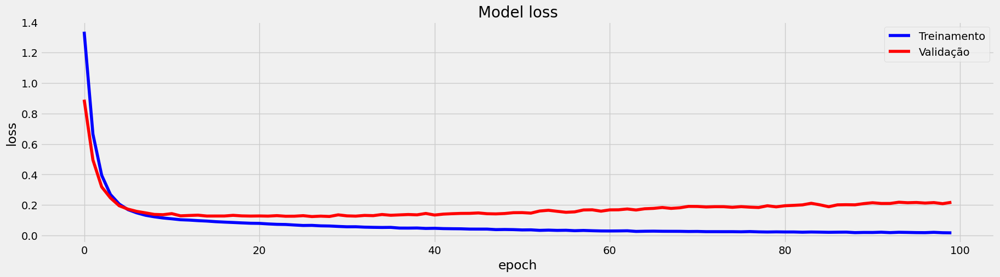

In [ ]:
# Plotando o historico do processo de treinamento
plt.figure(figsize=(20, 5))
plt.plot(history1.history['loss'], color='blue')
plt.plot(history1.history['val_loss'], color='red')
plt.title('Model loss', fontsize=20)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Treinamento', 'Validação'], loc='upper right', fontsize=14)
plt.show()

In [ ]:
# Avaliação
mpl1_score = model_mlp1.evaluate(x_teste_dim, y_teste_dim, verbose=0)
print('Test loss:', mpl1_score[0])
print('Test accuracy:', mpl1_score[1])

Test loss: 0.19570335745811462
Test accuracy: 0.9521035552024841


In [ ]:
resultados = add(resultados, model_mlp1, mpl1_score[1] * 100, True, params1)
resultados

{'modelo': <keras.src.engine.sequential.Sequential object at 0x7e9938b11f90>, 'nome': 'Sequential', 'acuracia': 95.21035552024841, 'inicial': True, 'parametros': {'l1': "Dense(8, input_shape=(60,), activation='tanh'))", 'l2': "Dense(8, activation='sigmoid'))", 'l3': "Dense(6, activation='sigmoid'))"}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 23**

In [ ]:
dummy = pd.get_dummies(df, columns = ['Activity'])

In [ ]:
dummy.iloc[:,-6:]

,Activity_LAYING,Activity_SITTING,Activity_STANDING,Activity_WALKING,Activity_WALKING_DOWNSTAIRS,Activity_WALKING_UPSTAIRS
0,0,0,1,0,0,0
1,0,0,1,0,0,0
2,0,0,1,0,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
10294,0,0,0,0,0,1
10295,0,0,0,0,0,1
10296,0,0,0,0,0,1
10297,0,0,0,0,0,1


In [ ]:
#Treinamento da MLP com a target transformada em dummies
fixa_seed()
df_features_dim = new_dim
df_target = dummy.iloc[:,-6:]
x_treino_dim, x_teste_dim, y_treino_dim, y_teste_dim = train_test_split(df_features_dim,
                                                        df_target,
                                                        test_size=0.3,
                                                        stratify=df_target,
                                                        random_state=fixa_seed()
                                                        )


In [ ]:
# Montagem do modelo
fixa_seed()
model_mlp2 = Sequential()

input_shape=x_treino_dim.shape[1]
# Layer de tamanho 8 e 8
model_mlp2.add(Dense(8, input_shape=(input_shape,), activation='tanh'))
model_mlp2.add(Dense(8, activation='sigmoid'))
# Layer de saída
model_mlp2.add(Dense(6, activation='sigmoid'))
model_mlp2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
params1 = {
"l1": f"Dense(8, input_shape=({x_treino_dim.shape[1]},), activation='tanh'))",
"l2":"Dense(8, activation='sigmoid'))",
"l3":"Dense(6, activation='sigmoid'))"
}

In [ ]:
print(params1)

{'l1': "Dense(8, input_shape=(60,), activation='tanh'))", 'l2': "Dense(8, activation='sigmoid'))", 'l3': "Dense(6, activation='sigmoid'))"}


In [ ]:
batch_size = 5
epochs = 100

history2 = model_mlp2.fit(x_treino_dim, y_treino_dim,
                        batch_size= batch_size,
                        epochs= epochs,
                        verbose= 1,
                        validation_split= 0.3)

Epoch 1/100
1010/1010 [==============================] - 5s 4ms/step - loss: 1.3286 - accuracy: 0.5392 - val_loss: 0.8813 - val_accuracy: 0.7651
Epoch 2/100
1010/1010 [==============================] - 4s 4ms/step - loss: 0.6653 - accuracy: 0.8660 - val_loss: 0.5017 - val_accuracy: 0.9168
Epoch 3/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.4047 - accuracy: 0.9263 - val_loss: 0.3261 - val_accuracy: 0.9362
Epoch 4/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.2787 - accuracy: 0.9374 - val_loss: 0.2386 - val_accuracy: 0.9436
Epoch 5/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.2141 - accuracy: 0.9467 - val_loss: 0.1937 - val_accuracy: 0.9468
Epoch 6/100
1010/1010 [==============================] - 4s 4ms/step - loss: 0.1763 - accuracy: 0.9514 - val_loss: 0.1660 - val_accuracy: 0.9491
Epoch 7/100
1010/1010 [==============================] - 3s 3ms/step - loss: 0.1522 - accuracy: 0.9538 - val_loss: 0.1536 - val_ac

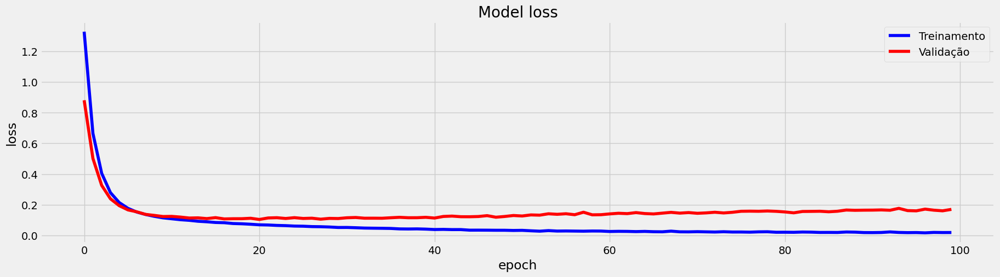

In [ ]:
# Plotando o historico do processo de treinamento
plt.figure(figsize=(20, 5))
plt.plot(history2.history['loss'], color='blue')
plt.plot(history2.history['val_loss'], color='red')
plt.title('Model loss', fontsize=20)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Treinamento', 'Validação'], loc='upper right', fontsize=14)
plt.show()

In [ ]:
# Avaliação
mpl2_score = model_mlp2.evaluate(x_teste_dim, y_teste_dim, verbose=0)
print('Test loss:', mpl2_score[0])
print('Test accuracy:', mpl2_score[1])

Test loss: 0.23536701500415802
Test accuracy: 0.9443365931510925


In [ ]:
resultados = add(resultados, model_mlp2, mpl2_score[1] * 100, True, params1)
resultados

{'modelo': <keras.src.engine.sequential.Sequential object at 0x7e99389bf850>, 'nome': 'Sequential', 'acuracia': 94.43365931510925, 'inicial': True, 'parametros': {'l1': "Dense(8, input_shape=(60,), activation='tanh'))", 'l2': "Dense(8, activation='sigmoid'))", 'l3': "Dense(6, activation='sigmoid'))"}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


#### **Configuração 24**

In [ ]:
# Montagem do modelo

model_mlp4 = Sequential()

# Layer de tamanho 32 e 2 atributos (altura e peso)
model_mlp4.add(Dense(8, input_shape=(input_shape,), activation='relu'))
model_mlp4.add(Dropout(0.5))
model_mlp4.add(Dense(32, activation='relu'))
model_mlp4.add(Dropout(0.5))
model_mlp4.add(Dense(128, activation='relu'))
model_mlp4.add(Dropout(0.5))
model_mlp4.add(Dense(8, activation='relu'))
model_mlp4.add(Dropout(0.5))
# Layer de saída
model_mlp4.add(Dense(6, activation='sigmoid'))
model_mlp4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
params4 = {"l":"Dense(8, input_shape=(2,), activation='relu'))",
"l":"Dropout(0.5))",
"l":"Dense(32, activation='relu'))",
"l":"Dropout(0.5))",
"l":"Dense(128, activation='relu'))",
"l":"Dropout(0.5))",
"l":"Dense(8, activation='relu'))",
"l":"Dropout(0.5))",
"l":"Dense(6, activation='sigmoid'))"}

In [ ]:
batch_size = 5
epochs = 100

history4 = model_mlp4.fit(x_treino_dim, y_treino_dim,
                        batch_size= batch_size,
                        epochs= epochs,
                        verbose= 1,
                        validation_split= 0.3)

Epoch 1/100
1010/1010 [==============================] - 8s 6ms/step - loss: 1.7716 - accuracy: 0.2342 - val_loss: 1.4420 - val_accuracy: 0.4910
Epoch 2/100
1010/1010 [==============================] - 4s 3ms/step - loss: 1.4837 - accuracy: 0.3317 - val_loss: 1.0093 - val_accuracy: 0.6681
Epoch 3/100
1010/1010 [==============================] - 3s 3ms/step - loss: 1.2904 - accuracy: 0.4027 - val_loss: 0.8292 - val_accuracy: 0.7050
Epoch 4/100
1010/1010 [==============================] - 5s 4ms/step - loss: 1.1896 - accuracy: 0.4318 - val_loss: 0.7886 - val_accuracy: 0.6214
Epoch 5/100
1010/1010 [==============================] - 4s 4ms/step - loss: 1.1548 - accuracy: 0.4489 - val_loss: 0.7340 - val_accuracy: 0.6875
Epoch 6/100
1010/1010 [==============================] - 3s 3ms/step - loss: 1.1026 - accuracy: 0.4681 - val_loss: 0.7202 - val_accuracy: 0.7032
Epoch 7/100
1010/1010 [==============================] - 3s 3ms/step - loss: 1.1095 - accuracy: 0.4715 - val_loss: 0.6760 - val_ac

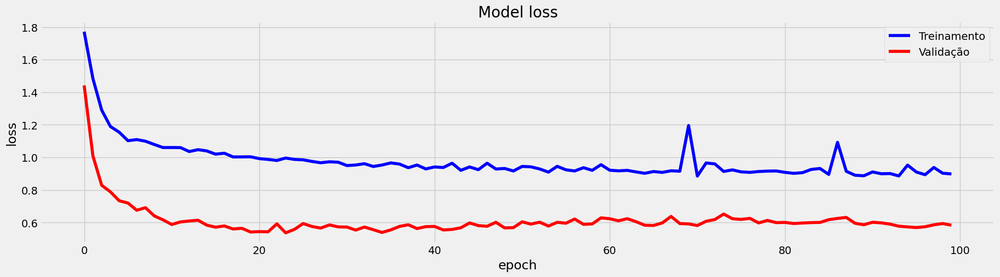

In [ ]:
# Plotando o historico do processo de treinamento
plt.figure(figsize=(20, 5))
plt.plot(history4.history['loss'], color='blue')
plt.plot(history4.history['val_loss'], color='red')
plt.title('Model loss', fontsize=20)
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Treinamento', 'Validação'], loc='upper right', fontsize=14)
plt.show()

In [ ]:
# Avaliação
model_mlp4_score = model_mlp4.evaluate(x_teste_dim, y_teste_dim, verbose=0)
print('Test loss:', model_mlp4_score[0])
print('Test accuracy:', model_mlp4_score[1])

Test loss: 0.6015383005142212
Test accuracy: 0.6482200622558594


In [ ]:
resultados = add(resultados, model_mlp4, model_mlp4_score[1]*100, False, params4)
resultados

{'modelo': <keras.src.engine.sequential.Sequential object at 0x7e993fe3fe80>, 'nome': 'Sequential', 'acuracia': 64.82200622558594, 'inicial': False, 'parametros': {'l': "Dense(6, activation='sigmoid'))"}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


In [ ]:
#classe ainda precisa de ajustes para que seus parametros de construção, tais como numero de camadas e quantidade de neurônios por camada, sejam dinâmicos, além das funções de ativação de cada camada, entre outros.
# Avaliar possibilidade da classe model_MLP ser derivada da classe base MLPClassifier para aplciação em cross_val_score do cross-validation
class model_MLP:
    def __init__(self,  x):
        fixa_seed()

        self.model = Sequential()
        input_shape=x.shape[1]
        self.model.add(Dense(8, input_shape=(input_shape,), activation='tanh'))
        self.model.add(Dense(8, activation='sigmoid'))
        # Layer de saída
        self.model.add(Dense(6, activation='sigmoid'))
        self.model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    def fit(self, x, y, batch_size, epochs):
      self.history = self.model.fit(self, x, y,
                        batch_size= batch_size,
                        epochs= epochs,
                        verbose= 1,
                        validation_split= 0.3)

    def score(this, x_teste, y_teste):
      return self.model.evaluate(x_teste_dim, y_teste_dim, verbose=0)[1]



In [898]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neural_network import MLPClassifier


# Suponha que você tenha seus dados X (características) e y (variável alvo codificada dummy)

# Defina o número de folds (por exemplo, 5)
num_folds = 5

# Crie um objeto KFold para controlar a divisão dos dados
kf = KFold(n_splits=num_folds, shuffle=True, random_state=fixa_seed())

model_mlp = MLPClassifier(hidden_layer_sizes=(8, 8), activation='tanh', solver='adam', random_state=fixa_seed())

# Realize a validação cruzada e obtenha as pontuações de desempenho
scores = cross_val_score(model_mlp, x_treino_dim, y_treino_dim, cv=kf)

# Exiba as pontuações de desempenho de cada fold
print("Pontuações de Desempenho por Fold:", scores)

# Calcule a média das pontuações para obter uma estimativa geral do desempenho do modelo
mean_score = scores.mean()
print("Média das Pontuações de Desempenho:", mean_score)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:693: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Pontuações de Desempenho por Fold: [0.88557559 0.95076283 0.9590846  0.9445215  0.95281055]
Média das Pontuações de Desempenho: 0.9385510139456631


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
params = model_mlp.get_params()

In [ ]:
resultados = add(resultados, model_mlp,  scores.mean()*100, False, params)
resultados

{'modelo': MLPClassifier(activation='tanh', hidden_layer_sizes=(8, 8), random_state=1), 'nome': 'MLPClassifier', 'acuracia': 95.15884619345674, 'inicial': False, 'parametros': {'activation': 'tanh', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (8, 8), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 200, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': 1, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}}


<ipython-input-729-b556a361c3ce>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  return d.append(row, ignore_index=True)
<ipython-input-729-b556a361c3ce>:12: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  return d.append(row, ignore_index=True)


,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


# Implementação do Modelo ML

In [899]:
resultados

,modelo,nome,acuracia,inicial,parametros
0,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.475728,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
1,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,93.430421,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
2,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,91.391586,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
3,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,89.546926,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
4,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,83.656958,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
5,"(DecisionTreeClassifier(max_features='sqrt', r...",RandomForestClassifier,97.669903,True,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w..."
6,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
7,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
8,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."
9,DummyClassifier(strategy='most_frequent'),DummyClassifier,18.867314,True,"{'constant': None, 'random_state': None, 'stra..."


In [ ]:
escolhido = resultados.sort_values(by='acuracia', ascending=False).iloc[0]
escolhido

modelo        (ExtraTreeClassifier(random_state=209652396), ...
nome                                       ExtraTreesClassifier
acuracia                                              98.381877
inicial                                                    True
parametros    {'bootstrap': False, 'ccp_alpha': 0.0, 'class_...
Name: 12, dtype: object

In [ ]:
clf_escolha = escolhido.modelo.set_params(**escolhido.parametros)
clf_escolha.fit(df_features_dim, df_target)

ExtraTreesClassifier(random_state=0)

# Salvando o Modelo

In [896]:
import pickle

# Salvando o modelo
saved_model = pickle.dumps(clf_escolha)



# Carregando o modelo e fazendo uma predição

In [897]:
#Carregar modelo
carregar_modelo = pickle.loads(saved_model)

# Usar o modelo para fazer predições
carregar_modelo.predict(x_teste_dim)

array([[0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0]], dtype=uint8)

# Considerações Finais

* Na configuração 5, foi utilizado RFECV(Recursive feature elimination with cross-validation to select features) para redução de dimensionalidade e observou-se que o modelo Random Forest treinado com esse dataset redimensionado apresentou uma boa performance com acurácia de 97.669903 %
* Na configuração 16, também foi utilizado RFECV(Recursive feature elimination with cross-validation to select features) para redução de dimensionalidade e em conjunto com o pipeline de modelos apresentou uma acurácia de 97.669903%
* As configurações com melhor acurácia foram com os modelos ExtraTreesClassifier e o pipeline de modelos StackingClassifier com 98.381877% e 98.155340% respectivamente.

Vale ressaltar que, embora a redução de dimensionalidade através RFECV tenha apresentado um melhor resultado, observou-se também um ganho considerável com a redução de dimensionalidade para 60, via PCA, tendo como entrada os 140 atributos mais fortemente correlacionados.

Mais especificamente, na configuração 01, o Random Forest treinado com 60 atributos teve uma acurácia de 93.430421%, sendo que esses mesmos 60 atributos aplicados em MLP tiveram acurácia de 94,43%